In [1]:
##### Import all necessity functions for Machine Learning #####
import sys
import math
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as shc
import warnings
from collections import Counter
from functools import reduce
from itertools import chain
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.feature_selection import mutual_info_classif, mutual_info_regression, SelectKBest, chi2, VarianceThreshold
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.over_sampling import RandomOverSampler, SMOTE, SMOTEN, SMOTENC, SVMSMOTE, KMeansSMOTE, BorderlineSMOTE, ADASYN
from imblearn.ensemble import EasyEnsembleClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor, NearestNeighbors
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDClassifier, SGDRegressor, Perceptron
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.svm import SVC, SVR
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, ExtraTreeClassifier, ExtraTreeRegressor
from sklearn.ensemble import BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor, VotingClassifier, VotingRegressor
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor, GradientBoostingClassifier, GradientBoostingRegressor, StackingClassifier, StackingRegressor
from sklearn.metrics import classification_report, mean_absolute_error, mean_squared_error, r2_score, accuracy_score, recall_score, precision_score, f1_score, silhouette_score
from xgboost import XGBClassifier, XGBRegressor

##### Download keras #####
!pip install keras

##### Import all necessity functions for Neural Network #####
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Conv2D, LSTM, GRU, RNN, Flatten, AvgPool2D, MaxPool2D, GlobalAveragePooling2D, BatchNormalization, Dropout, LeakyReLU, ELU, PReLU
from tensorflow.keras.activations import tanh, relu, sigmoid, softmax, swish
from tensorflow.keras.regularizers import L1, L2, L1L2
from tensorflow.keras.optimizers import SGD, Adagrad, Adadelta, RMSprop, Adam, Adamax, Nadam
from tensorflow.keras.initializers import HeNormal, HeUniform, GlorotNormal, GlorotUniform
from tensorflow.keras.losses import SparseCategoricalCrossentropy, CategoricalCrossentropy, hinge, MSE, MAE, Huber

##### Remove all warnings #####
import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
##### Import the text file of this dataset #####
text_file1_   = pd.read_csv('/content/realclass_t1.txt', delimiter   = '|', na_values = ['?', '??'])
text_file2_   = pd.read_csv('/content/realClass_t2.txt', delimiter   = '|', na_values = ['?', '??'])
target_file1_ = pd.read_csv('/content/transact_class.txt', delimiter = '|', na_values = ['?', '??'])
target_file2_ = pd.read_csv('/content/transact_train.txt', delimiter = '|', na_values = ['?', '??'])

In [3]:
##### Show the text file #####
text_file1_.head()

,sessionNo,prediction
0,1,1
1,2,1
2,3,1
3,4,0
4,5,0


In [4]:
##### Show the text file ####
text_file2_.head()

,sessionNo,prediction
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0


In [5]:
##### Show the text file ####
target_file1_.head()

,sessionNo,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,...,onlineStatus,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder
0,1,18,7,136.833,3,39.99,39.99,79.98,1,39.99,...,y,completely orderable,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
1,1,18,7,189.984,3,39.99,39.99,79.98,1,39.99,...,y,completely orderable,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
2,1,18,7,342.894,6,16.99,39.99,113.96,2,16.99,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
3,1,18,7,411.051,8,16.99,39.99,149.94,3,16.99,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
4,1,18,7,460.049,10,16.99,39.99,189.92,4,16.99,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0


In [6]:
##### Show the text file ####
target_file2_.head()

,sessionNo,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
0,1,6,5,0.000,1,59.99,59.99,59.99,1,59.99,...,NaN,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
1,1,6,5,11.940,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
2,1,6,5,39.887,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
3,2,6,5,0.000,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,y
4,2,6,5,15.633,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,y


In [7]:
##### Show the shape of each text file #####
print(f'realclass_t1.txt shape is {text_file1_.shape}')
print(f'realClass_t2.txt shape is {text_file2_.shape}')
print(f'transact_class.txt shape is {target_file1_.shape}')
print(f'transact_train.txt shape is {target_file2_.shape}')

realclass_t1.txt shape is (5111, 2)
realClass_t2.txt shape is (30000, 2)
transact_class.txt shape is (45068, 23)
transact_train.txt shape is (429013, 24)


In [8]:
##### Merge the dataset for training file #####
df = text_file1_.merge(target_file1_, how = 'inner', on = 'sessionNo')

##### Show the dataset #####
df.head()

,sessionNo,prediction,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,...,onlineStatus,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder
0,1,1,18,7,136.833,3,39.99,39.99,79.98,1,...,y,completely orderable,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
1,1,1,18,7,189.984,3,39.99,39.99,79.98,1,...,y,completely orderable,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
2,1,1,18,7,342.894,6,16.99,39.99,113.96,2,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
3,1,1,18,7,411.051,8,16.99,39.99,149.94,3,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0
4,1,1,18,7,460.049,10,16.99,39.99,189.92,4,...,NaN,NaN,25039.0,1300.0,489.0,188.0,5.0,49.0,1.0,65.0


In [9]:
##### Import the dataset #####
df = pd.read_csv('/content/transact_train.txt', delimiter = '|', na_values = ['?', '??'])

df.head()

,sessionNo,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
0,1,6,5,0.000,1,59.99,59.99,59.99,1,59.99,...,NaN,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
1,1,6,5,11.940,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
2,1,6,5,39.887,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,y
3,2,6,5,0.000,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,y
4,2,6,5,15.633,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,y


Perform EDA - exploratory data analysis to understand the pattern of the data.

In [10]:
##### how the shape of this dataset #####
print('The number of records of this dataset is {}'.format(df.shape[0]))
print('The number of columns of this dataset is {}'.format(df.shape[1]))

The number of records of this dataset is 429013
The number of columns of this dataset is 24


In [11]:
##### Check the dataset contains NaN value or not #####
if df.isnull().sum().sum() == 0:
  print('The dataset does not have NaN value.')
else:
  print('The dataset contains NaN value.')

The dataset contains NaN value.


In [12]:
##### Show the NaN value of the dataset ######
df.isnull().sum()

sessionNo               0
startHour               0
startWeekday            0
duration                0
cCount                  0
cMinPrice            2765
cMaxPrice            2765
cSumPrice            2765
bCount                  0
bMinPrice            5130
bMaxPrice            5130
bSumPrice            5130
bStep              191333
onlineStatus       160379
availability       165255
customerNo         151098
maxVal             153740
customerScore      153740
accountLifetime    153740
payments           151098
age                151396
address            151098
lastOrder          151098
order                   0
dtype: int64

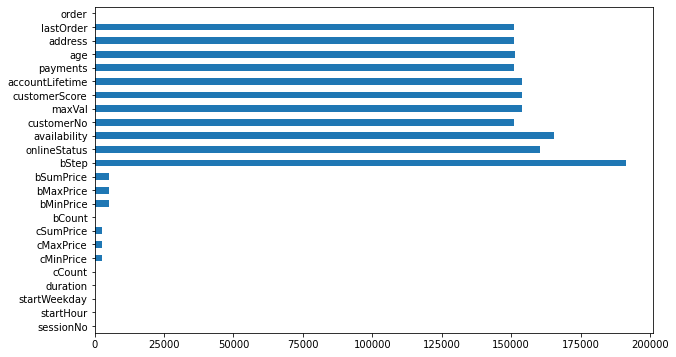

In [13]:
##### Plot the NaN value so thar we can understand it #####
plt.figure(figsize = (10, 6))
df.isnull().sum().plot(kind = 'barh')
plt.show()

In [14]:
##### Comments after analysing #####
print('''The dataset contains huge NaN values and it should be prevented.''')

The dataset contains huge NaN values and it should be prevented.


In [15]:
##### Check the columns name of this dataset #####
print([column_ for column_ in df.columns])

['sessionNo', 'startHour', 'startWeekday', 'duration', 'cCount', 'cMinPrice', 'cMaxPrice', 'cSumPrice', 'bCount', 'bMinPrice', 'bMaxPrice', 'bSumPrice', 'bStep', 'onlineStatus', 'availability', 'customerNo', 'maxVal', 'customerScore', 'accountLifetime', 'payments', 'age', 'address', 'lastOrder', 'order']


In [16]:
##### Convert the target column in numerical #####
df.loc[:, 'order'] = df.loc[:, 'order'].map({'y': 1, 'n': 0})

df.head()

,sessionNo,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
0,1,6,5,0.000,1,59.99,59.99,59.99,1,59.99,...,NaN,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
1,1,6,5,11.940,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
2,1,6,5,39.887,1,59.99,59.99,59.99,1,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
3,2,6,5,0.000,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,2,6,5,15.633,0,NaN,NaN,NaN,0,NaN,...,completely orderable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [17]:
##### Show the dataset of target class is imbalanced or not #####
df.loc[:, 'order'].value_counts()

1    290030
0    138983
Name: order, dtype: int64

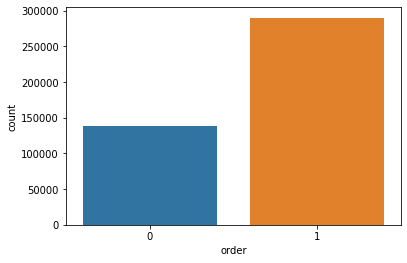

In [18]:
##### Plot this value counts #####
sns.countplot(df.loc[:, 'order'])
plt.show()

In [19]:
##### Comments after analysing #####
print(''''The dataset is quite imbalanced. Let's check in both cases.''')

'The dataset is quite imbalanced. Let's check in both cases.


In [20]:
##### Show the info of this dataset #####
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429013 entries, 0 to 429012
Data columns (total 24 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   sessionNo        429013 non-null  int64  
 1   startHour        429013 non-null  int64  
 2   startWeekday     429013 non-null  int64  
 3   duration         429013 non-null  float64
 4   cCount           429013 non-null  int64  
 5   cMinPrice        426248 non-null  float64
 6   cMaxPrice        426248 non-null  float64
 7   cSumPrice        426248 non-null  float64
 8   bCount           429013 non-null  int64  
 9   bMinPrice        423883 non-null  float64
 10  bMaxPrice        423883 non-null  float64
 11  bSumPrice        423883 non-null  float64
 12  bStep            237680 non-null  float64
 13  onlineStatus     268634 non-null  object 
 14  availability     263758 non-null  object 
 15  customerNo       277915 non-null  float64
 16  maxVal           275273 non-null  floa

In [21]:
##### Find - how many features are categorical and numerical #####
print('The categorical features of this dataset is given below\n')
print(list(df.dtypes[df.dtypes == 'object'].index))
print('*'*250)

print('The numeical features of this dataset is given below\n')
for _ in list(df.dtypes[df.dtypes != 'object'].index):
  print(_, end = ", ")

The categorical features of this dataset is given below

['onlineStatus', 'availability']
**********************************************************************************************************************************************************************************************************************************************************
The numeical features of this dataset is given below

sessionNo, startHour, startWeekday, duration, cCount, cMinPrice, cMaxPrice, cSumPrice, bCount, bMinPrice, bMaxPrice, bSumPrice, bStep, customerNo, maxVal, customerScore, accountLifetime, payments, age, address, lastOrder, order, 

In [22]:
##### Delete the sessionNo feature of this dataset #####
df.drop(['sessionNo'], axis = 1, inplace = True)

print("The sessionNo column is deleted.\n")

print('The number of features now we have {}'.format(df.shape[1]))

The sessionNo column is deleted.

The number of features now we have 23


In [23]:
##### Find the correlation of this dataset #####
df.corr()

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,bStep,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
startHour,1.000000,-0.190481,-0.011656,0.024340,-0.005557,0.007425,0.015022,0.006948,-0.003826,-0.003145,...,-0.006795,0.167560,-0.026342,-0.005359,0.016345,-0.065240,0.003550,0.003223,0.033290,0.041708
startWeekday,-0.190481,1.000000,-0.009270,-0.017763,-0.046745,-0.040826,-0.026649,0.005619,-0.047266,-0.045830,...,-0.009094,0.887082,-0.027784,-0.017979,0.021433,-0.040243,0.023125,0.015143,0.010759,0.043388
duration,-0.011656,-0.009270,1.000000,0.591746,-0.077389,0.128542,0.247165,0.367563,-0.048678,0.040665,...,-0.004636,-0.033175,0.001624,-0.010161,-0.076475,0.082249,-0.071217,0.007561,0.003666,0.049930
cCount,0.024340,-0.017763,0.591746,1.000000,-0.174226,0.045813,0.277217,0.577157,-0.153797,-0.058860,...,-0.074264,-0.006958,-0.042338,-0.006849,-0.060658,0.018614,-0.116197,0.069994,-0.000707,0.104753
cMinPrice,-0.005557,-0.046745,-0.077389,-0.174226,1.000000,0.594742,0.253526,-0.185901,0.917804,0.751359,...,0.027671,-0.033381,-0.020298,-0.028217,-0.028717,-0.022864,-0.018681,-0.083342,0.039849,-0.134947
cMaxPrice,0.007425,-0.040826,0.128542,0.045813,0.594742,1.000000,0.625703,-0.016587,0.669715,0.817595,...,0.008781,-0.027946,-0.004876,-0.019510,-0.028019,-0.012051,-0.020494,-0.064122,0.024053,-0.103256
cSumPrice,0.015022,-0.026649,0.247165,0.277217,0.253526,0.625703,1.000000,0.094004,0.354775,0.502861,...,-0.022585,-0.017478,-0.037610,-0.019190,-0.039596,-0.025615,-0.038139,-0.022369,0.024148,-0.049833
bCount,0.006948,0.005619,0.367563,0.577157,-0.185901,-0.016587,0.094004,1.000000,-0.193092,-0.032283,...,-0.035181,0.002575,0.108192,0.040429,0.060082,0.133794,0.001613,0.068525,-0.031084,0.176186
bMinPrice,-0.003826,-0.047266,-0.048678,-0.153797,0.917804,0.669715,0.354775,-0.193092,1.000000,0.820243,...,0.022141,-0.035070,-0.025228,-0.029300,-0.036345,-0.025851,-0.020940,-0.083217,0.043406,-0.145736
bMaxPrice,-0.003145,-0.045830,0.040665,-0.058860,0.751359,0.817595,0.502861,-0.032283,0.820243,1.000000,...,0.020871,-0.033192,0.006855,-0.020142,-0.019847,0.001015,-0.014440,-0.071450,0.027247,-0.120827


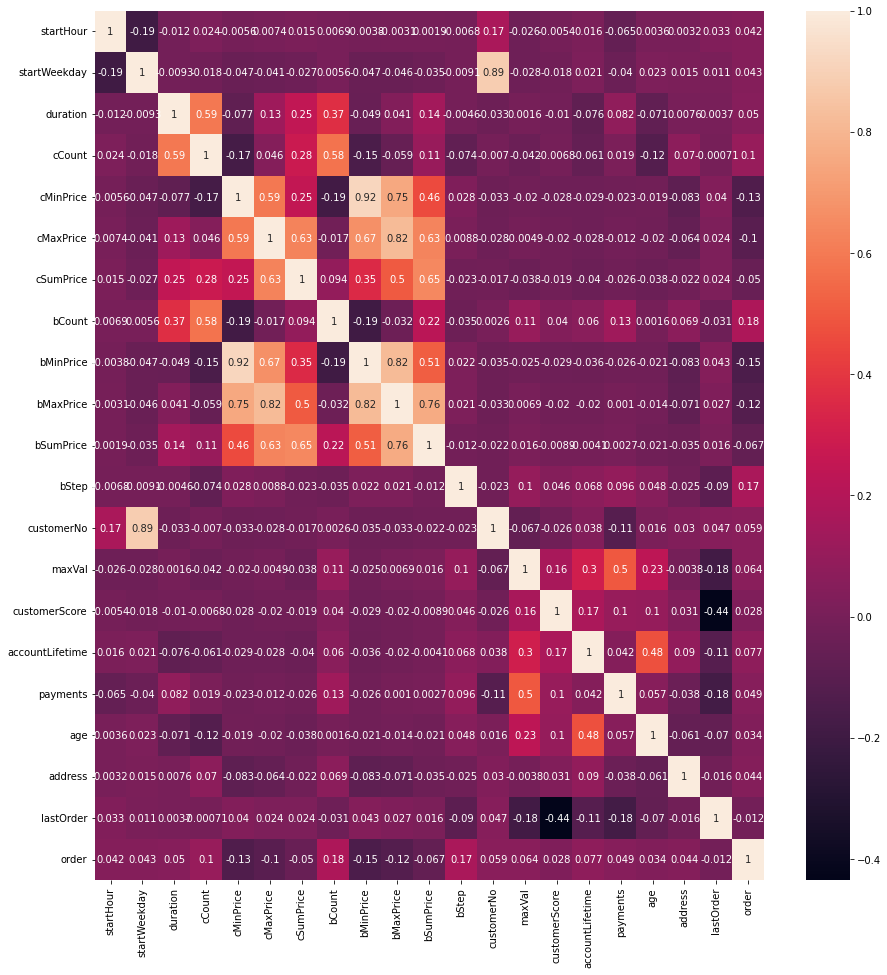

In [24]:
##### Plot this correlation in seaborn #####
plt.figure(figsize = (15, 16))
sns.heatmap(df.corr(), annot = True)
plt.show()

In [25]:
##### Comments after analyse #####
print('There is some columns that have correlation with some other features.')

There is some columns that have correlation with some other features.


In [26]:
##### Describe of this dataset #####
df.describe()

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,bStep,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
count,429013.000000,429013.000000,429013.000000,429013.000000,426248.000000,426248.000000,426248.000000,429013.000000,423883.000000,423883.000000,...,237680.000000,277915.000000,275273.000000,275273.000000,275273.000000,277915.000000,277617.000000,277915.000000,277915.000000,429013.000000
mean,14.617061,5.924839,1573.901640,24.140317,55.289127,146.663005,1189.248209,4.135168,67.625341,107.505057,...,2.292393,12184.130921,2486.358270,485.298449,135.557403,15.218016,44.919861,1.734556,79.883975,0.676040
std,4.485914,0.790930,2427.123356,30.398164,148.879937,283.217841,3371.173815,4.451778,174.986371,212.916300,...,1.306963,7297.774184,3038.425813,131.027630,109.577139,34.892917,11.935945,0.443903,113.201967,0.467985
min,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,17.000000,1.000000,3.000000,0.000000
25%,11.000000,5.000000,225.070000,5.000000,6.990000,25.950000,137.960000,1.000000,8.990000,19.990000,...,1.000000,5793.000000,600.000000,481.000000,43.000000,3.000000,36.000000,1.000000,14.000000,0.000000
50%,15.000000,6.000000,738.199000,13.000000,12.000000,49.990000,388.000000,3.000000,14.990000,39.990000,...,2.000000,12045.000000,1500.000000,520.000000,109.000000,8.000000,45.000000,2.000000,34.000000,1.000000
75%,18.000000,7.000000,1880.265000,31.000000,29.990000,99.990000,1046.430000,5.000000,34.990000,79.790000,...,3.000000,18350.000000,4000.000000,555.000000,219.000000,15.000000,53.000000,2.000000,86.000000,1.000000
max,23.000000,7.000000,21580.092000,200.000000,5999.990000,6999.990000,115742.000000,108.000000,6999.990000,6999.990000,...,5.000000,25038.000000,50000.000000,638.000000,600.000000,868.000000,99.000000,3.000000,738.000000,1.000000


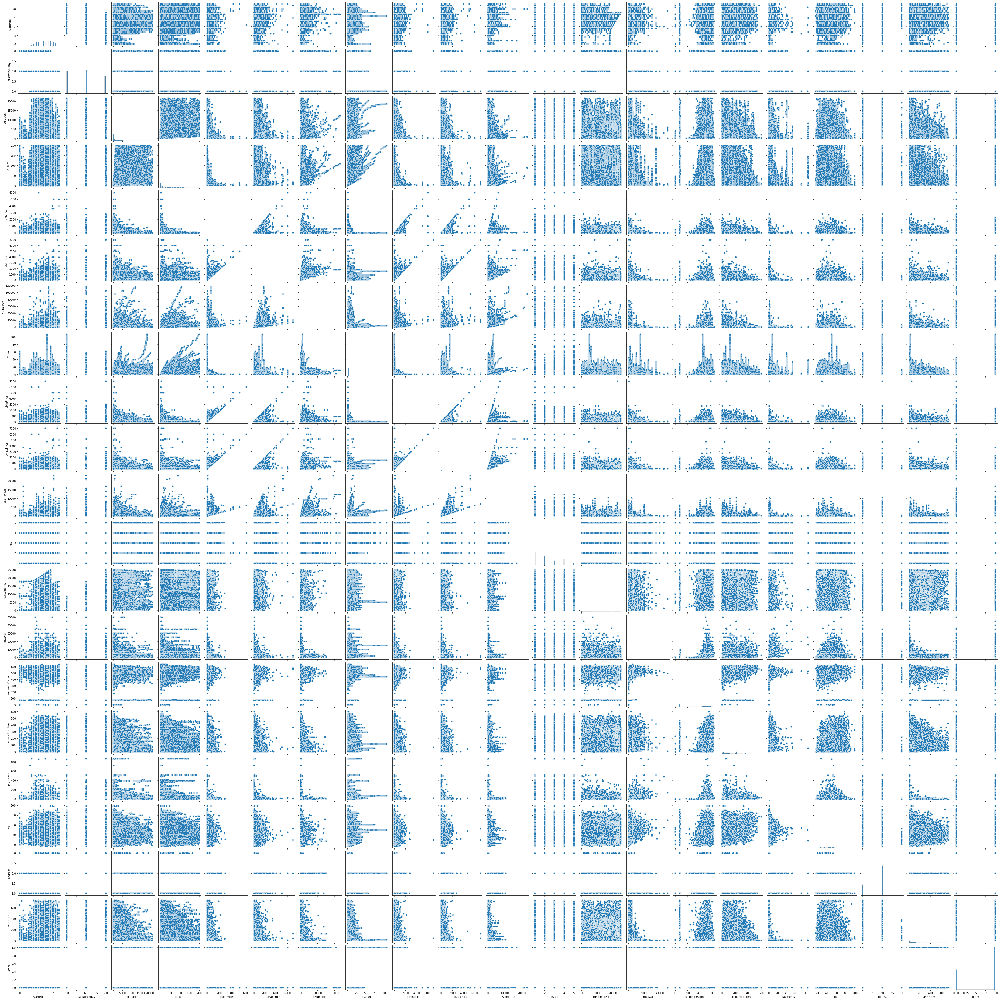

In [27]:
##### Plot the pairplot of this dataset #####
sns.pairplot(df)
plt.show()

In [28]:
##### Comments after analyse #####
print('''There is some linear relation appears with some of features.''')

There is some linear relation appears with some of features.


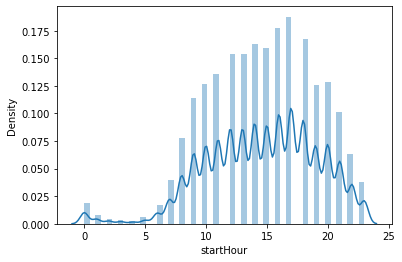

************************************************************************************************************************
The histogram of startHour is given below.



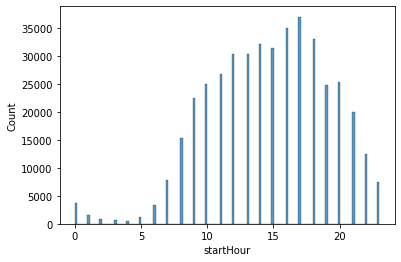

************************************************************************************************************************
The distribution of startHour is given below.

17    37030
16    34988
18    33093
14    32120
15    31385
12    30441
13    30311
11    26865
20    25390
10    24978
19    24830
9     22550
21    20001
8     15417
22    12568
7      7782
23     7399
0      3630
6      3406
1      1513
5      1128
2       915
3       703
4       570
Name: startHour, dtype: int64
************************************************************************************************************************
The PLOT of distribution of startHour is given below.



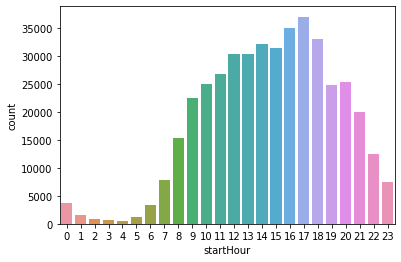

In [29]:
##### Show the destribution of the startHour #####
sns.distplot(df.loc[:, 'startHour'])
plt.show()
print('*'*120)

##### Show the destribution of the startHour  #####
print('The histogram of startHour is given below.\n')
sns.histplot(df.loc[:, 'startHour'])
plt.show()
print('*'*120)

##### Show the value counts of this feature #####
print('The distribution of startHour is given below.\n')
print(df.loc[:, 'startHour'].value_counts())
print('*'*120)

##### Plot the value counts of this feature #####
print('The PLOT of distribution of startHour is given below.\n')
sns.countplot(df.loc[:, 'startHour'])
plt.show()

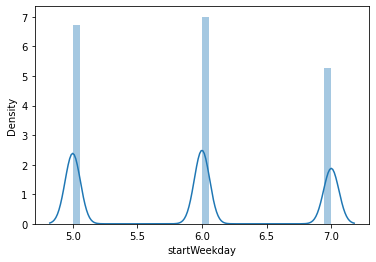

************************************************************************************************************************
The value counts of this startWeekday is given below.

************************************************************************************************************************


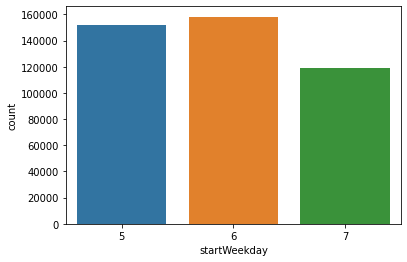

In [30]:
##### Show the distribution of startWeekday #####
sns.distplot(df.loc[:, 'startWeekday'])
plt.show()
print('*'*120)

##### Show the value counts of this startWeekday #####
print('The value counts of this startWeekday is given below.\n')
df.loc[:, 'startWeekday'].value_counts()
print('*'*120)

##### Plot this value counts of this startWeekday #####
sns.countplot(df.loc[:, 'startWeekday'])
plt.show()

Order has been placed based on startweekday is given below.

startWeekday
5     97976
6    108987
7     83067
Name: order, dtype: int64 


************************************************************************************************************************
Order has been placed based on startweekday is given below.

startWeekday
5    0.646608
6    0.688867
7    0.696415
Name: order, dtype: float64 


************************************************************************************************************************


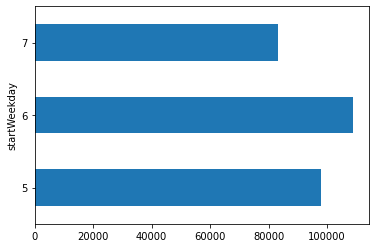

In [31]:
##### Find a query, on startWeekday how many order has been placed #####
print('Order has been placed based on startweekday is given below.\n')
print(df.groupby(['startWeekday'])['order'].sum(),'\n\n')
print('*'*120)

##### Find a query, on startWeekday how many order has been placed #####
print('Order has been placed based on startweekday is given below.\n')
print(df.groupby(['startWeekday'])['order'].mean(),'\n\n')
print('*'*120)

##### Plot this to better understand #####
df.groupby(['startWeekday'])['order'].sum().plot(kind = 'barh')
plt.show()

In [32]:
#####Comments after analyse #####
print('Most of the order has been placed on Saturday.')

Most of the order has been placed on Saturday.


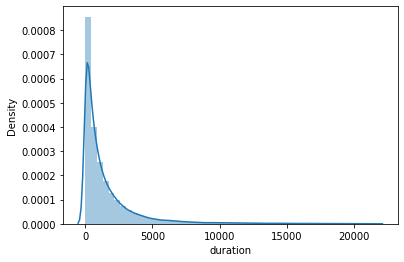

************************************************************************************************************************
Min time passed during placed order no not.

order
0    0.0
1    0.0
Name: duration, dtype: float64
************************************************************************************************************************
Max time passed during placed order no not.

order
0    21580.092
1    21517.005
Name: duration, dtype: float64 



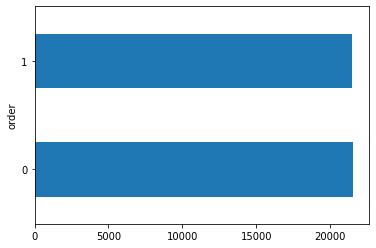

************************************************************************************************************************
Aerage time passed during placed order no not.

order
0    1398.839128
1    1657.791973
Name: duration, dtype: float64 



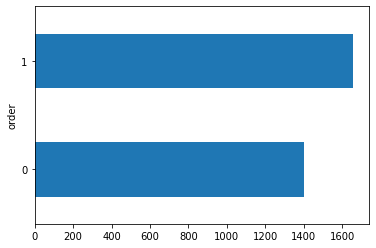

In [33]:
##### Show the distribution of duration feature #####
sns.distplot(df.loc[:, 'duration'])
plt.show()
print('*'*120)

##### Find out a query, those who have placed an order - how many min seconds they have passed #####
print('Min time passed during placed order no not.\n')
print(df.groupby(['order'])['duration'].min())
print('*'*120)

##### Find out a query, those who have placed an order - how many max seconds they have passed #####
print('Max time passed during placed order no not.\n')
print(df.groupby(['order'])['duration'].max(),'\n')
df.groupby(['order'])['duration'].max().plot(kind = 'barh')
plt.show()
print('*'*120)

##### Find out a query, those who have placed an order - how many average seconds they have passed #####
print('Aerage time passed during placed order no not.\n')
print(df.groupby(['order'])['duration'].mean(),'\n')
df.groupby(['order'])['duration'].mean().plot(kind = 'barh')
plt.show()

startWeekday
5    68289.316362
6    67201.708420
7    52071.270909
Name: duration, dtype: float64
************************************************************************************************************************
The plot of spending time based on weekdays.


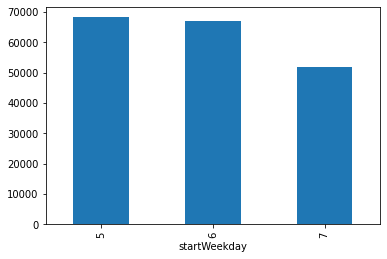

In [34]:
##### Show the relationship of startWeekday and duration #####
print(df.groupby(['startWeekday'])['duration'].sum()/3600)
print('*'*120)
print('The plot of spending time based on weekdays.')
(df.groupby(['startWeekday'])['duration'].sum()/3600).plot(kind = 'bar')
plt.show()

In [35]:
##### Print the relationship of order, startWeekday and duration #####
print(df.groupby(['order', 'startWeekday'])['duration'].sum()/3600,'\n\n')
print('It is clearly see that, the most placed ordered on Saturady - (6) and its duration is higher than others.')

order  startWeekday
0      5               20985.699871
       6               19360.759884
       7               13657.667620
1      5               47303.616492
       6               47840.948536
       7               38413.603289
Name: duration, dtype: float64 


It is clearly see that, the most placed ordered on Saturady - (6) and its duration is higher than others.


In [36]:
df.head(2)

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
0,6,5,0.00,1,59.99,59.99,59.99,1,59.99,59.99,...,NaN,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
1,6,5,11.94,1,59.99,59.99,59.99,1,59.99,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1


The distribution of cCount is given below.



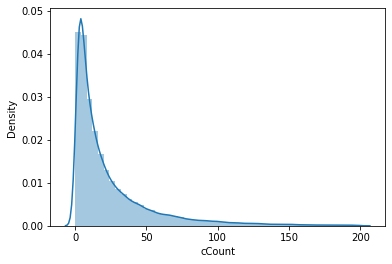

************************************************************************************************************************
The relationship of cCount and duration is given below.



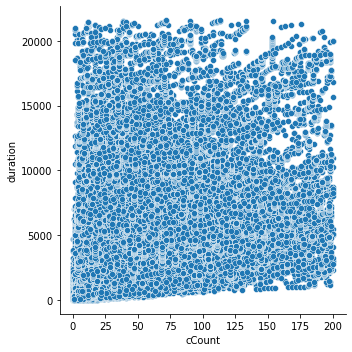

************************************************************************************************************************
The relationship of cCount and duration with startWeekday is given below.



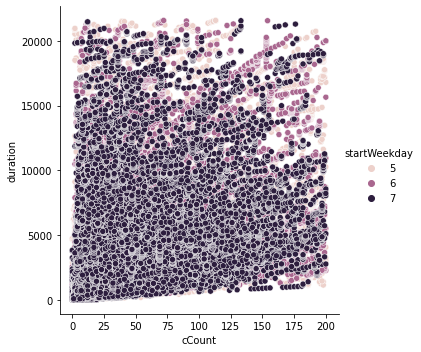

The relationship of cCount and duration with startWeekday is given below.



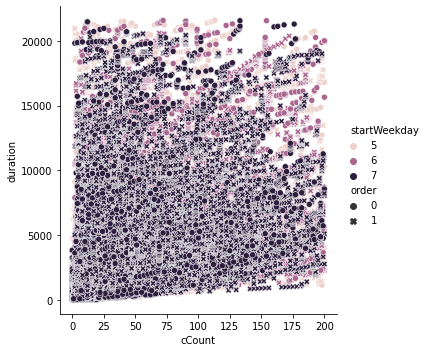

In [37]:
##### Show the distribution of cCount feature #####
print('The distribution of cCount is given below.\n')
sns.distplot(df.loc[:, 'cCount'])
plt.show()
print('*'*120)

##### Find the relationship of cCount and duration #####
print('The relationship of cCount and duration is given below.\n')
sns.relplot(x = 'cCount', y = 'duration', data = df)
plt.show()
print('*'*120)

##### Find the relationship of cCount and duration with startWeek #####
print('The relationship of cCount and duration with startWeekday is given below.\n')
sns.relplot(x = 'cCount', y = 'duration', hue = 'startWeekday', data = df)
plt.show()

##### Find the relationship of cCount and duration with startWeek, and order #####
print('The relationship of cCount and duration with startWeekday is given below.\n')
sns.relplot(x = 'cCount', y = 'duration', hue = 'startWeekday', style = 'order', data = df)
plt.show()

In [38]:
##### Find a query, what's the maximum number of product clicked on those who placed order #####
print('the maximum number of product clicked on those who placed order or not is given below.\n'.capitalize())
print(df.groupby(['order'])['cCount'].max(),'\n')

##### Find a query, what's the minimum number of product clicked on those who placed order #####
print('the maximum number of product clicked on those who placed order or not is given below.\n'.capitalize())
print(df.groupby(['order'])['cCount'].min(),'\n')

##### Find a query, what's the mean number of product clicked on those who placed order #####
print('the mean number of product clicked on those who placed order or not is given below.\n'.capitalize())
print(df.groupby(['order'])['cCount'].mean(),'\n')

The maximum number of product clicked on those who placed order or not is given below.

order
0    200
1    200
Name: cCount, dtype: int64 

The maximum number of product clicked on those who placed order or not is given below.

order
0    0
1    0
Name: cCount, dtype: int64 

The mean number of product clicked on those who placed order or not is given below.

order
0    19.540347
1    26.344633
Name: cCount, dtype: float64 



The number of clicked 50 items but not taken the items  =  14015 

The number of clicked 50 items and also taken the items =  44524 



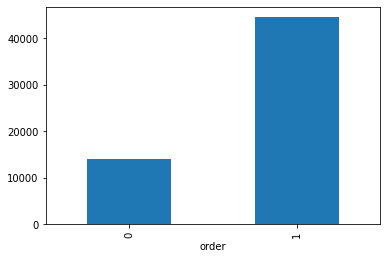

In [39]:
##### Find out a query, those who have clicked more than 50 items but not take the items #####
def find(group):
  return group[group['cCount'] > 50].shape[0]

print("The number of clicked 50 items but not taken the items  = ",df.groupby(['order']).apply(find)[0],'\n')

##### Find out a query, those who have clicked more than 50 items and also take the items #####
def find(group):
  return group[group['cCount'] > 50].shape[0]

print("The number of clicked 50 items and also taken the items = ",df.groupby(['order']).apply(find)[1],'\n')

df.groupby(['order']).apply(find).plot(kind = 'bar')
plt.show()

The distribution of cMinPrice is given below.



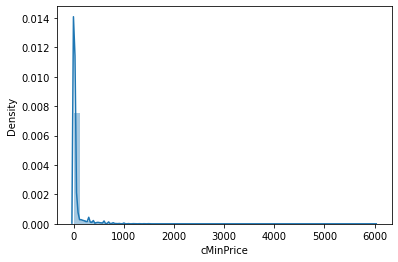

The relationship cMinPrice and order is given below.



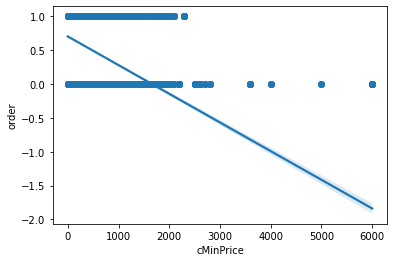

In [40]:
##### Show the distribution of cMinPrice #####
print('The distribution of cMinPrice is given below.\n')
sns.distplot(df.loc[:, 'cMinPrice'])
plt.show()

##### Plot the relationship cMinPrice and order #####
print('The relationship cMinPrice and order is given below.\n')
sns.regplot(x = 'cMinPrice', y = 'order', data = df)
plt.show()

In [41]:
##### Find out a query, top 5 items that has been placed based on cMinPrice and lowest duration#####
def find_items(group):
  return group[group['cMinPrice'] > 0].sort_values(by = ['cMinPrice', 'duration']).head(5)

df.groupby(['order']).apply(find_items)

startHour  startWeekday  duration  cCount  cMinPrice  cMaxPrice  \
order                                                                           
0     188605         12             6   188.912       3       0.80       0.80   
      188606         12             6   195.127       3       0.80       0.80   
      95590          17             5   891.505      14       0.80       6.99   
      403133         16             7  1317.788       8       0.80      88.99   
      403134         16             7  1320.495       8       0.80      88.99   
1     187043         12             6    25.407       5       0.19      29.99   
      187044         12             6    29.365       5       0.19      29.99   
      187045         12             6    34.138       5       0.19      29.99   
      187046         12             6    44.068       5       0.19      29.99   
      3886            7             5    48.694       4       0.19       3.00   

              cSumPrice  bCount  bMinPrice  bMaxPrice  ...  \
order                                                  ...   
0     188605       0.80       3       0.80       0.80  ...   
      188606       0.80       3       0.80       0.80  ...   
      95590       51.81       1       4.95       4.95  ...   
      403133     263.69       1       0.80       0.80  ...   
      403134     263.69       1       0.80       0.80  ...   
1     187043      60.36       2       0.19      29.99  ...   
      187044      60.36       2       0.19      29.99  ...   
      187045      60.36       2       0.19      29.99  ...   
      187046      60.36       2       0.19      29.99  ...   
      3886         6.19       1       3.00       3.00  ...   

                      availability  customerNo   maxVal customerScore  \
order                                                                   
0     188605                   NaN         NaN      NaN           NaN   
      188606      mainly orderable         NaN      NaN           NaN   
      95590                    NaN         NaN      NaN           NaN   
      403133                   NaN     23533.0  14600.0         585.0   
      403134  completely orderable     23533.0  14600.0         585.0   
1     187043                   NaN      6354.0   1300.0         508.0   
      187044  completely orderable      6354.0   1300.0         508.0   
      187045  completely orderable      6354.0   1300.0         508.0   
      187046  completely orderable      6354.0   1300.0         508.0   
      3886                     NaN       248.0   1500.0         545.0   

              accountLifetime  payments   age  address  lastOrder  order  
order                                                                     
0     188605              NaN       NaN   NaN      NaN        NaN      0  
      188606              NaN       NaN   NaN      NaN        NaN      0  
      95590               NaN       NaN   NaN      NaN        NaN      0  
      403133            224.0     304.0  47.0      1.0        4.0      0  
      403134            224.0     304.0  47.0      1.0        4.0      0  
1     187043             38.0     243.0  57.0      2.0        3.0      1  
      187044             38.0     243.0  57.0      2.0        3.0      1  
      187045             38.0     243.0  57.0      2.0        3.0      1  
      187046             38.0     243.0  57.0      2.0        3.0      1  
      3886               27.0      81.0  29.0      1.0       25.0      1  

[10 rows x 23 columns]

In [42]:
##### Find out a query, top 5 items that has been placed based on cMinPrice and highest duration#####
def find_items(group):
  return group[group['cMinPrice'] > 0].sort_values(by = ['cMinPrice', 'duration'], ascending = [True, False]).head(5)

df.groupby(['order']).apply(find_items)

startHour  startWeekday  duration  cCount  cMinPrice  cMaxPrice  \
order                                                                           
0     393014         15             7  2618.725      23       0.80      59.95   
      393013         15             7  2497.732      23       0.80      59.95   
      393012         15             7  2365.116      23       0.80      59.95   
      393011         15             7  2359.114      23       0.80      59.95   
      393010         15             7  2348.620      23       0.80      59.95   
1     52093          13             5  1575.597      41       0.19     170.00   
      52092          13             5  1569.065      41       0.19     170.00   
      52091          13             5  1564.084      41       0.19     170.00   
      52090          13             5  1559.237      41       0.19     170.00   
      52089          13             5  1547.783      41       0.19     170.00   

              cSumPrice  bCount  bMinPrice  bMaxPrice  ...  \
order                                                  ...   
0     393014     547.23       5       0.80      34.97  ...   
      393013     547.23       5       0.80      34.97  ...   
      393012     547.23       5       0.80      34.97  ...   
      393011     547.23       5       0.80      34.97  ...   
      393010     547.23       5       0.80      34.97  ...   
1     52093     1283.68       4       4.99      24.99  ...   
      52092     1283.68       4       4.99      24.99  ...   
      52091     1283.68       4       4.99      24.99  ...   
      52090     1283.68       4       4.99      24.99  ...   
      52089     1283.68       4       4.99      24.99  ...   

                      availability  customerNo maxVal customerScore  \
order                                                                 
0     393014      mainly orderable     22933.0  300.0          70.0   
      393013      mainly orderable     22933.0  300.0          70.0   
      393012      mainly orderable     22933.0  300.0          70.0   
      393011      mainly orderable     22933.0  300.0          70.0   
      393010      mainly orderable     22933.0  300.0          70.0   
1     52093   completely orderable      3144.0  300.0         459.0   
      52092   completely orderable      3144.0  300.0         459.0   
      52091   completely orderable      3144.0  300.0         459.0   
      52090   completely orderable      3144.0  300.0         459.0   
      52089   completely orderable      3144.0  300.0         459.0   

              accountLifetime  payments   age  address  lastOrder  order  
order                                                                     
0     393014             14.0       0.0  28.0      2.0      448.0      0  
      393013             14.0       0.0  28.0      2.0      448.0      0  
      393012             14.0       0.0  28.0      2.0      448.0      0  
      393011             14.0       0.0  28.0      2.0      448.0      0  
      393010             14.0       0.0  28.0      2.0      448.0      0  
1     52093               0.0       1.0  26.0      2.0       10.0      1  
      52092               0.0       1.0  26.0      2.0       10.0      1  
      52091               0.0       1.0  26.0      2.0       10.0      1  
      52090               0.0       1.0  26.0      2.0       10.0      1  
      52089               0.0       1.0  26.0      2.0       10.0      1  

[10 rows x 23 columns]

In [43]:
##### Find out 10 min Price items but not taken #####
def find(group):
  return group.loc[group['cMinPrice'].nsmallest(10).index, :]
df[df.loc[:, 'cMinPrice'] > 0].groupby(['order']).apply(find)

startHour  startWeekday  duration  cCount  cMinPrice  cMaxPrice  \
order                                                                           
0     95590          17             5   891.505      14       0.80       6.99   
      188605         12             6   188.912       3       0.80       0.80   
      188606         12             6   195.127       3       0.80       0.80   
      393008         15             7  2160.267      23       0.80      59.95   
      393009         15             7  2172.793      23       0.80      59.95   
      393010         15             7  2348.620      23       0.80      59.95   
      393011         15             7  2359.114      23       0.80      59.95   
      393012         15             7  2365.116      23       0.80      59.95   
      393013         15             7  2497.732      23       0.80      59.95   
      393014         15             7  2618.725      23       0.80      59.95   
1     3886            7             5    48.694       4       0.19       3.00   
      3887            7             5   144.652      13       0.19      59.99   
      3888            7             5   245.485      22       0.19      64.99   
      3889            7             5   269.921      25       0.19      64.99   
      3890            7             5   299.441      28       0.19      64.99   
      3891            7             5   391.066      28       0.19      64.99   
      3892            7             5   409.449      29       0.19      64.99   
      3893            7             5   426.551      30       0.19      64.99   
      3894            7             5   435.030      31       0.19      64.99   
      3895            7             5   443.100      31       0.19      64.99   

              cSumPrice  bCount  bMinPrice  bMaxPrice  ...  \
order                                                  ...   
0     95590       51.81       1       4.95       4.95  ...   
      188605       0.80       3       0.80       0.80  ...   
      188606       0.80       3       0.80       0.80  ...   
      393008     547.23       5       0.80      34.97  ...   
      393009     547.23       5       0.80      34.97  ...   
      393010     547.23       5       0.80      34.97  ...   
      393011     547.23       5       0.80      34.97  ...   
      393012     547.23       5       0.80      34.97  ...   
      393013     547.23       5       0.80      34.97  ...   
      393014     547.23       5       0.80      34.97  ...   
1     3886         6.19       1       3.00       3.00  ...   
      3887       546.10       2       3.00      59.99  ...   
      3888      1071.01       3       3.00      64.99  ...   
      3889      1265.98       4       3.00      64.99  ...   
      3890      1460.95       5       3.00      64.99  ...   
      3891      1460.95       5       3.00      64.99  ...   
      3892      1525.94       5       3.00      64.99  ...   
      3893      1590.93       5       3.00      64.99  ...   
      3894      1655.92       5       3.00      64.99  ...   
      3895      1655.92       5       3.00      64.99  ...   

                      availability  customerNo  maxVal customerScore  \
order                                                                  
0     95590                    NaN         NaN     NaN           NaN   
      188605                   NaN         NaN     NaN           NaN   
      188606      mainly orderable         NaN     NaN           NaN   
      393008                   NaN     22933.0   300.0          70.0   
      393009      mainly orderable     22933.0   300.0          70.0   
      393010      mainly orderable     22933.0   300.0          70.0   
      393011      mainly orderable     22933.0   300.0          70.0   
      393012      mainly orderable     22933.0   300.0          70.0   
      393013      mainly orderable     22933.0   300.0          70.0   
      393014      mainly orderable     22933.0   300.0          70.0   
1 

The distribution of max price product that is clicked on.



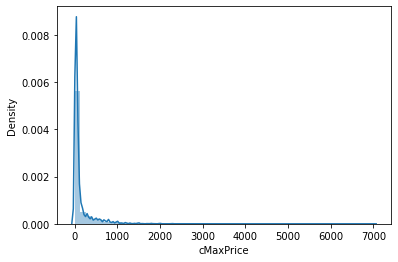

************************************************************************************************************************
The distribution of cCount and cMinPrice is given below.



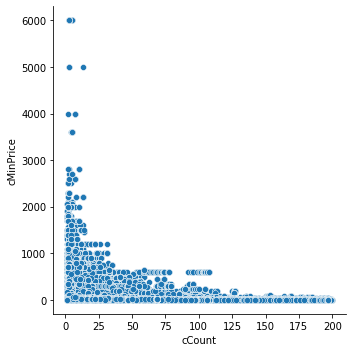

************************************************************************************************************************
The distribution of cCount and cMinPrice and order is given below.



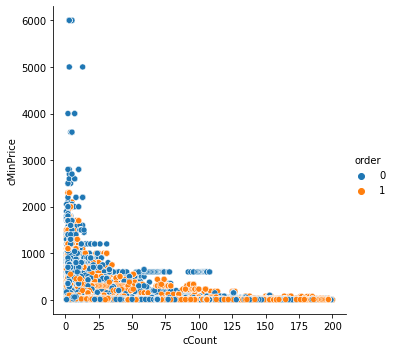

************************************************************************************************************************
The distribution of cCount and cMaxPrice is given below.



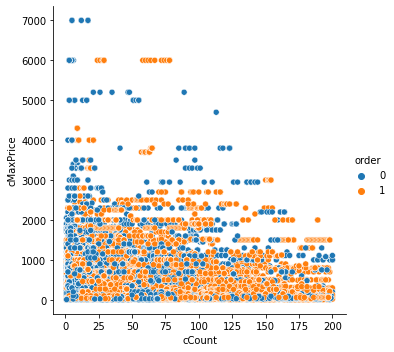

************************************************************************************************************************
The distribution of cCount and cMaxPrice, order and minPrice is given below.



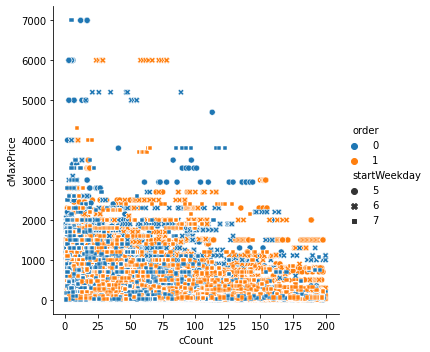

In [44]:
##### Show the distribution of max price product that is clicked on #####
print('The distribution of max price product that is clicked on.\n')
sns.distplot(df.loc[:, 'cMaxPrice'])
plt.show()
print('*'*120)

##### Plot the distribution of cCount and cMinPrice is given below #####
print('The distribution of cCount and cMinPrice is given below.\n')
sns.relplot(x = 'cCount', y = 'cMinPrice', data = df)
plt.show()
print('*'*120)

##### Plot the distribution of cCount and cMinPrice with order is given below #####
print('The distribution of cCount and cMinPrice and order is given below.\n')
sns.relplot(x = 'cCount', y = 'cMinPrice', hue = 'order', data = df)
plt.show()
print('*'*120)

##### Plot the distribution of cCount and cMinPrice with order is given below #####
print('The distribution of cCount and cMaxPrice is given below.\n')
sns.relplot(x = 'cCount', y = 'cMaxPrice', hue = 'order', data = df)
plt.show()
print('*'*120)

##### Plot the distribution of cCount and cMinPrice with order is given below #####
print('The distribution of cCount and cMaxPrice, order and minPrice is given below.\n')
sns.relplot(x = 'cCount', y = 'cMaxPrice', hue = 'order', style = 'startWeekday', data = df)
plt.show()

In [45]:
##### Find a query that, how many items(5) that is not purchased based on max price #####
def find_items(group):
  return group[group['cMaxPrice'].isin(group['cMaxPrice'].nlargest(5).values)]
df.groupby(['order']).apply(find_items)

startHour  startWeekday  duration  cCount  cMinPrice  cMaxPrice  \
order                                                                           
0     145237         22             5   467.740      12      29.99    6999.99   
      145238         22             5   495.812      12      29.99    6999.99   
      145239         22             5   866.588      17       9.99    6999.99   
      145240         22             5   882.571      17       9.99    6999.99   
      145241         22             5   901.494      17       9.99    6999.99   
      145242         22             5   930.802      17       9.99    6999.99   
      393569         15             7   112.145       5      29.99    6999.99   
      393570         15             7   123.578       5      29.99    6999.99   
      393571         15             7   152.722       5      29.99    6999.99   
1     157573          7             6  3207.993      58       9.99    5999.99   
      157574          7             6  3225.728      60       9.99    5999.99   
      157575          7             6  3235.554      62       9.99    5999.99   
      157576          7             6  3247.545      64       9.99    5999.99   
      157577          7             6  3320.972      67       9.99    5999.99   
      157578          7             6  3419.381      72       9.99    5999.99   
      157579          7             6  3464.173      74       9.99    5999.99   
      157580          7             6  3515.656      76       9.99    5999.99   
      157581          7             6  3554.897      78       9.99    5999.99   
      157582          7             6  3577.444      78       9.99    5999.99   
      157583          7             6  3606.928      78       9.99    5999.99   
      157584          7             6  3850.406      78       9.99    5999.99   
      157585          7             6  3898.158      78       9.99    5999.99   
      157586          7             6  3912.297      78       9.99    5999.99   
      308383         23             6  1337.698      24       1.00    5999.99   
      308384         23             6  1373.677      26       1.00    5999.99   
      308385         23             6  1454.146      28       1.00    5999.99   
      308386         23             6  1624.517      29       1.00    5999.99   
      308387         23             6  1647.898      29       1.00    5999.99   
      308388         23             6  1727.964      29       1.00    5999.99   
      308389         23             6  1737.596      29       1.00    5999.99   
      308390         23             6  1766.961      29       1.00    5999.99   
      308391         23             6  1812.828      29       1.00    5999.99   

              cSumPrice  bCount  bMinPrice  bMaxPrice  ...  \
order                                                  ...   
0     145237   14519.68       2      34.99    6999.99  ...   
      145238   14519.68       2      34.99    6999.99  ...   
      145239   14592.63       3      14.99    6999.99  ...   
      145240   14592.63       3      14.99    6999.99  ...   
      145241   14592.63       3      14.99    6999.99  ...   
      145242   14592.63       3      14.99    6999.99  ...   
      393569   21059.95       1    6999.99    6999.99  ...   
      393570   21059.95       1    6999.99    6999.99  ...   
      393571   21059.95       1    6999.99    6999.99  ...   
1     157573   14838.10       3      16.95      79.99  ...   
      157574   14884.08       4      16.95      79.99  ...   
      157575   14934.06       5      16.95      79.99  ...   
      157576   14964.04       6      14.99      79.99  ...   
      157577   15142.01       7      14.99      79.99  ...   
      157578   15391.96       8      14.99      79.99  ...   
      157579   15451.94       9      14.99      79.99  ...   
      157580   15531.92      10      14.99      79.99  ...   
      157581   16131.90      11      14.99     299.99  ...   
      157582   1613

In [46]:
##### Find a query that, how many items(5) that is not purchased based on min price from CmaxPrice#####
def find_items(group):
  return group[group['cMaxPrice'].isin(group[group['cMaxPrice'] > 0].sort_values(by = 'cMaxPrice', ascending = True)['cMaxPrice'].head(1).values)]
  
df.groupby(['order']).apply(find_items)

startHour  startWeekday  duration  cCount  cMinPrice  cMaxPrice  \
order                                                                           
0     188605         12             6   188.912       3       0.80       0.80   
      188606         12             6   195.127       3       0.80       0.80   
1     152864          0             6     1.516       2       0.99       0.99   

              cSumPrice  bCount  bMinPrice  bMaxPrice  ...      availability  \
order                                                  ...                     
0     188605       0.80       3       0.80       0.80  ...               NaN   
      188606       0.80       3       0.80       0.80  ...  mainly orderable   
1     152864       1.98       1       0.99       0.99  ...               NaN   

              customerNo maxVal customerScore  accountLifetime  payments  \
order                                                                      
0     188605         NaN    NaN           NaN              NaN       NaN   
      188606         NaN    NaN           NaN              NaN       NaN   
1     152864      8755.0  500.0         546.0              1.0       1.0   

               age  address  lastOrder  order  
order                                          
0     188605   NaN      NaN        NaN      0  
      188606   NaN      NaN        NaN      0  
1     152864  35.0      1.0       10.0      1  

[3 rows x 23 columns]

The distribution of sum price product that is clicked on.



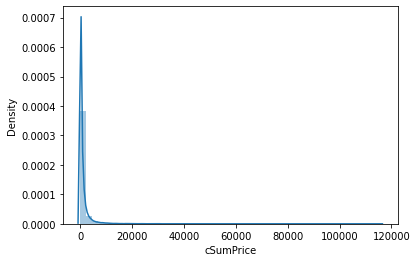

************************************************************************************************************************
The distribution of sum price product that is clicked on.



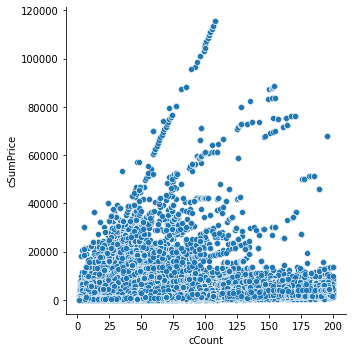

************************************************************************************************************************
The distribution of sum price, cCount and order product that is clicked on.



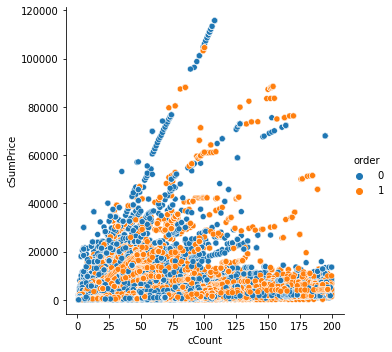

************************************************************************************************************************
The distribution of sum price, cCount and order product that is clicked on.



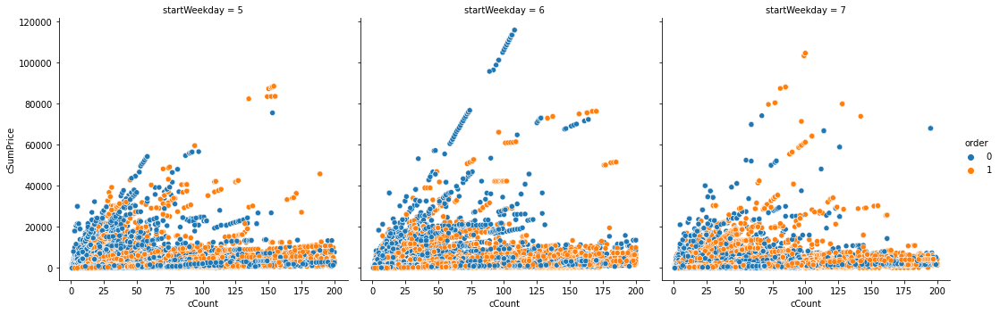

************************************************************************************************************************


In [47]:
##### Find the distribution of cSumPrice that is clicked on #####
print('The distribution of sum price product that is clicked on.\n')
sns.distplot(df.loc[:, 'cSumPrice'])
plt.show()
print('*'*120)

##### Find the distribution of cSumPrice and cCount that is clicked on #####
print('The distribution of sum price product that is clicked on.\n')
sns.relplot(x = 'cCount', y = 'cSumPrice', data = df)
plt.show()
print('*'*120)

##### Find the distribution of cSumPrice and cCount and order that is clicked on #####
print('The distribution of sum price, cCount and order product that is clicked on.\n')
sns.relplot(x = 'cCount', y = 'cSumPrice', hue = 'order' ,data = df)
plt.show()
print('*'*120)

##### Find the distribution of cSumPrice and cCount and order that is clicked on #####
print('The distribution of sum price, cCount and order product that is clicked on.\n')
sns.relplot(x = 'cCount', y = 'cSumPrice', hue = 'order' , col = 'startWeekday', data = df)
plt.show()
print('*'*120)

The relationship of duration and price is given below.



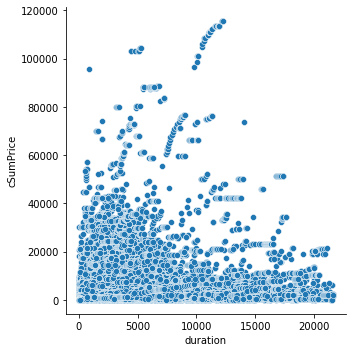

************************************************************************************************************************
The relationship of duration and price with order is given below.



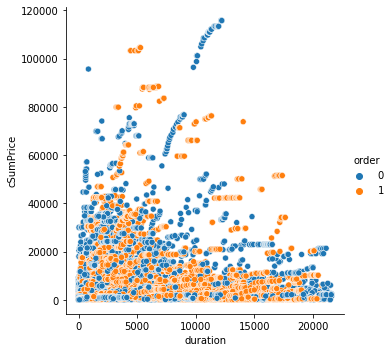

In [48]:
##### Plot the relationship of duration and Sum Price #####
print('The relationship of duration and price is given below.\n')
sns.relplot(x = 'duration', y = 'cSumPrice', data = df)
plt.show()
print('*'*120)

##### Plot the relationship of duration and Sum Price with order #####
print('The relationship of duration and price with order is given below.\n')
sns.relplot(x = 'duration', y = 'cSumPrice', hue = 'order', data = df)
plt.show()

In [49]:
df.head(3)

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
0,6,5,0.000,1,59.99,59.99,59.99,1,59.99,59.99,...,NaN,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
1,6,5,11.940,1,59.99,59.99,59.99,1,59.99,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
2,6,5,39.887,1,59.99,59.99,59.99,1,59.99,59.99,...,completely orderable,1.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1


In [50]:
##### Find how many items has been ordered based on the greater than mean of sum price #####

print(df[df.loc[:, 'cSumPrice'] > df.loc[:, 'cSumPrice'].mean()]['order'].value_counts(),'\n')

##### Find how many items has been ordered based on the lower than mean of sum price #####

print(df[df.loc[:, 'cSumPrice'] < df.loc[:, 'cSumPrice'].mean()]['order'].value_counts())

1    61341
0    34151
Name: order, dtype: int64 

1    227774
0    102982
Name: order, dtype: int64


The distribution of bCount is given below.



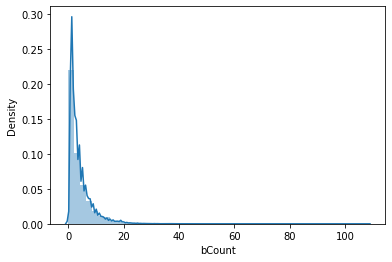

The relationship the number of product that put in shopping basket(bCount) and cCount is given below.



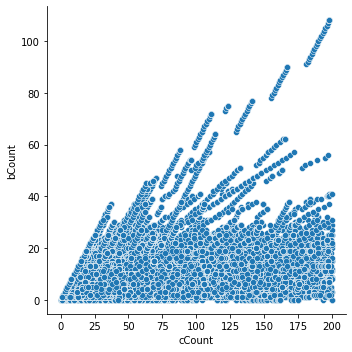

The relationship the number of product that put in shopping basket(bCount) and cCount with order is given below.



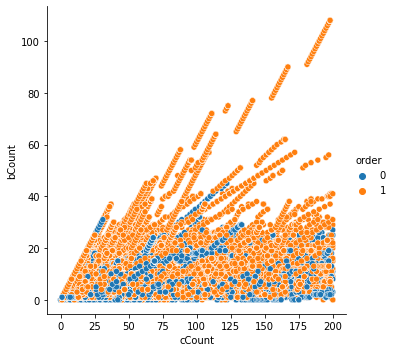

The relationship the number of product that put in shopping basket(bCount) and cCount with order is given below.



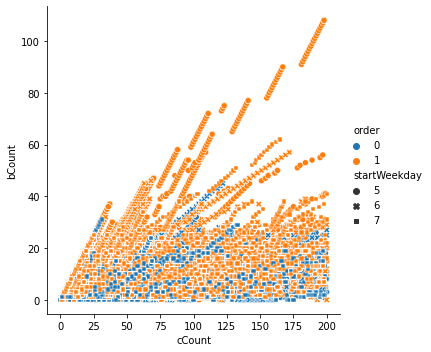

In [51]:
##### Show the distribution of bCount #####
print('The distribution of bCount is given below.\n')
sns.distplot(df.loc[:, 'bCount'])
plt.show()

##### Show the relationship the number of product that put in shopping basket(bCount) and cCount #####
print('The relationship the number of product that put in shopping basket(bCount) and cCount is given below.\n')
sns.relplot(x = 'cCount', y = 'bCount', data = df)
plt.show()

##### Show the relationship the number of product that put in shopping basket(bCount) and cCount with order #####
print('The relationship the number of product that put in shopping basket(bCount) and cCount with order is given below.\n')
sns.relplot(x = 'cCount', y = 'bCount', hue = 'order', data = df)
plt.show()

##### Show the relationship the number of product that put in shopping basket(bCount) and cCount with order, weekday separately #####
print('The relationship the number of product that put in shopping basket(bCount) and cCount with order is given below.\n')
sns.relplot(x = 'cCount', y = 'bCount', hue = 'order', style = 'startWeekday', data = df)
plt.show()

In [52]:
##### Find out, those who put the items more than 50 in the basket and taken the items #####
def find_numbers(group):
  return group[group['bCount'] > 50]

print("The items more than 50 in the basket and taken the items number is {}".format(df.groupby(['order']).apply(find_numbers).shape[0]))

The items more than 50 in the basket and taken the items number is 181


The distribution of lowest price that is put in the basket is given below.



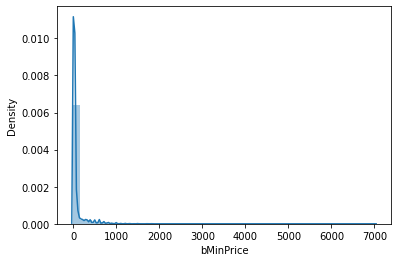

************************************************************************************************************************
The relationship of lowest price that put in the basket and number of product that put in the basket is given below.



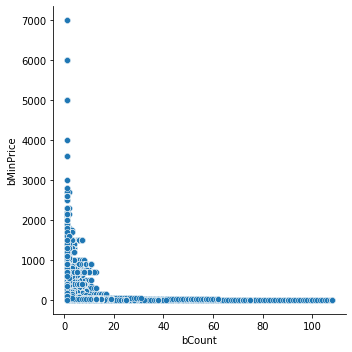

************************************************************************************************************************
The relationship of lowest price that put in the basket and number of product that put in the basket with clicked product is given below.



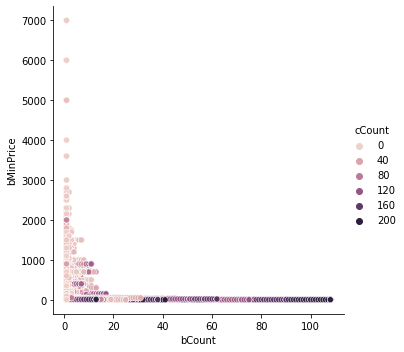

************************************************************************************************************************


In [53]:
##### Show the distribution of lowest price that is put in the basket #####
print('The distribution of lowest price that is put in the basket is given below.\n')
sns.distplot(df.loc[:, 'bMinPrice'])
plt.show()
print('*'*120)

##### Show the relationship of lowest price that put in the basket and number of product that put in the basket #####
print('The relationship of lowest price that put in the basket and number of product that put in the basket is given below.\n')
sns.relplot(x = 'bCount', y = 'bMinPrice', data = df)
plt.show()
print('*'*120)

##### Show the relationship of lowest price that put in the basket and number of product that put in the basket with clicked product #####
print('The relationship of lowest price that put in the basket and number of product that put in the basket with clicked product is given below.\n')
sns.relplot(x = 'bCount', y = 'bMinPrice', hue = 'cCount', data = df)
plt.show()
print('*'*120)

In [54]:
##### Find out, the number of orders based on startWeekday the max 3 number of clicked on product with the lowest 2 price of product that put in the basket #####
def find_query(group):
  first_ =  group[group['cCount'].isin(group['cCount'].nlargest(3).values)]
  return first_[first_['bCount'].isin(first_['bCount'].nsmallest(2).values)]

df.groupby(['order', 'startWeekday']).apply(find_query)

startHour  startWeekday   duration  cCount  \
order startWeekday                                                      
0     5            5989            8             5   8721.253     200   
                   133924         21             5  10271.836     200   
      6            214399         15             6  19970.613     200   
                   214400         15             6  19985.541     200   
                   214401         15             6  20003.004     200   
      7            359618         12             7   8560.793     200   
                   396517         16             7   4748.303     199   
1     5            12720           9             5   2977.449     200   
                   19680           9             5   3027.998     200   
                   19681           9             5   3233.065     200   
      6            175737         10             6   5025.166     200   
                   175738         10             6   5072.434     200   
      7            345332         11             7   5109.909     200   
                   368846         13             7   8216.948     200   

                           cMinPrice  cMaxPrice  cSumPrice  bCount  bMinPrice  \
order startWeekday                                                              
0     5            5989         7.00      99.95    7736.56      11       9.95   
                   133924       3.00      99.95    2625.81       3       5.99   
      6            214399       3.99     999.99   13556.65      25       9.99   
                   214400       3.99     999.99   13556.65      25       9.99   
                   214401       3.99     999.99   13556.65      25       9.99   
      7            359618       3.00     199.99    4110.90       8       3.00   
                   396517       4.99     119.99    5158.50       2      19.99   
1     5            12720        1.00      49.99    1940.84       8       3.00   
                   19680        3.00      69.95    3151.46      15       3.00   
                   19681        3.00      69.95    3151.46      15       3.00   
      6            175737       1.00      99.99    6689.82       0        NaN   
                   175738       1.00      99.99    6689.82       0        NaN   
      7            345332       2.99      99.99    2240.12      16       3.99   
                   368846       1.00     129.95    4315.60      22       3.00   

                           bMaxPrice  ...          availability  customerNo  \
order startWeekday                    ...                                     
0     5            5989        59.95  ...                   NaN         NaN   
                   133924       7.00  ...                   NaN      7833.0   
      6            214399     299.99  ...  completely orderable         NaN   
                   214400     299.99  ...                   NaN         NaN   
                   214401     299.99  ...                   NaN         NaN   
      7            359618      42.01  ...                   NaN     20970.0   
                   396517      49.95  ...                   NaN         NaN   
1     5            12720        7.00  ...                   NaN       786.0   
                   19680       34.99  ...      mainly orderable         NaN   
                   19681       34.99  ...  completely orderable         NaN   
      6            175737        NaN  ...                 mixed     10051.0   
                   175738        NaN  ...  completely orderable     10051.0   
      7            345332      29.99  ...                   NaN     20177.0   
                   368846      49.99  ...      mainly orderable     21509.0   

                            maxVal customerScore  accountLifetime  payments  \
order startWeekday                                                            
0     5            5989        NaN           NaN              NaN       NaN   
                   133924    500.0         362.0           

In [55]:
##### Find out, the number of orders based on startWeekday the max 3 number of clicked on product with the highest 2 price of product that put in the basket #####
def find_query(group):
  first_ =  group[group['cCount'].isin(group['cCount'].nlargest(3).values)]
  return first_[first_['bCount'].isin(first_['bCount'].nlargest(2).values)]

df.groupby(['order', 'startWeekday']).apply(find_query)

startHour  startWeekday   duration  cCount  \
order startWeekday                                                      
0     5            3699            7             5  16798.938     200   
                   5989            8             5   8721.253     200   
      6            214399         15             6  19970.613     200   
                   214400         15             6  19985.541     200   
                   214401         15             6  20003.004     200   
                   236173         16             6  15648.686     200   
      7            310176          0             7  11139.417     199   
                   310177          0             7  11173.154     199   
                   310178          0             7  11272.498     199   
                   425447         18             7   5717.237     199   
1     5            19680           9             5   3027.998     200   
                   19681           9             5   3233.065     200   
                   42085          12             5   4056.081     200   
      6            152733          0             6   2271.234     200   
                   279272         20             6  10940.027     200   
      7            340972         11             7   2766.929     200   
                   343705         11             7   8051.726     200   

                           cMinPrice  cMaxPrice  cSumPrice  bCount  bMinPrice  \
order startWeekday                                                              
0     5            3699         5.00      99.99    3465.37      15       6.00   
                   5989         7.00      99.95    7736.56      11       9.95   
      6            214399       3.99     999.99   13556.65      25       9.99   
                   214400       3.99     999.99   13556.65      25       9.99   
                   214401       3.99     999.99   13556.65      25       9.99   
                   236173       0.99    1110.99    8676.12      27       5.99   
      7            310176       5.99     149.99    4637.52       9       9.99   
                   310177       5.99     149.99    4637.52       9       9.99   
                   310178       5.99     149.99    4637.52       9       9.99   
                   425447       1.00      39.99    1695.93      13       7.00   
1     5            19680        3.00      69.95    3151.46      15       3.00   
                   19681        3.00      69.95    3151.46      15       3.00   
                   42085        2.00      60.00    3642.03      20       2.00   
      6            152733       4.99      59.95    4722.94      29       9.99   
                   279272       7.00     269.99    9936.84      21       9.99   
      7            340972       1.00      17.99    1318.66      31       1.00   
                   343705       1.00      79.99    2072.84      41       1.00   

                           bMaxPrice  ...          availability  customerNo  \
order startWeekday                    ...                                     
0     5            3699        34.99  ...                   NaN         NaN   
                   5989        59.95  ...                   NaN         NaN   
      6            214399     299.99  ...  completely orderable         NaN   
                   214400     299.99  ...                   NaN         NaN   
                   214401     299.99  ...                   NaN         NaN   
                   236173     149.95  ...                   NaN         NaN   
      7            310176      33.60  ...  completely orderable         NaN   
                   310177      33.60  ...  completely orderable         NaN   
                   310178      33.60  ...  completely orderable         NaN   
                   425447      29.99  ...                   NaN         NaN   
1     5            19680       34.99  ...      mainly orderable         NaN   
                   19681       34.99  ...  completely orderable         

The distribution of maximum price that is put in the basket is given below.



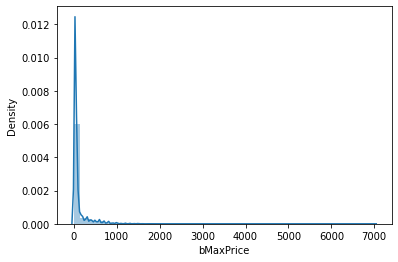

************************************************************************************************************************
The relationship of maximum price that put in the basket and number of product that put in the basket is given below.



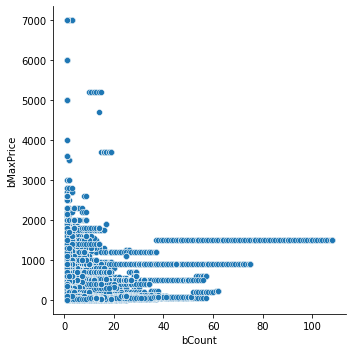

************************************************************************************************************************
The relationship of maximum price that put in the basket and number of product that put in the basket with clicked product is given below.



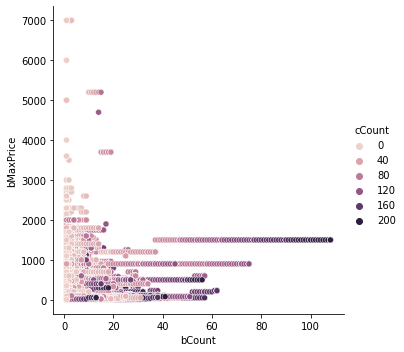

************************************************************************************************************************


In [56]:
##### Show the distribution of maximum price that is put in the basket #####
print('The distribution of maximum price that is put in the basket is given below.\n')
sns.distplot(df.loc[:, 'bMaxPrice'])
plt.show()
print('*'*120)

##### Show the relationship of maximum price that put in the basket and number of product that put in the basket #####
print('The relationship of maximum price that put in the basket and number of product that put in the basket is given below.\n')
sns.relplot(x = 'bCount', y = 'bMaxPrice', data = df)
plt.show()
print('*'*120)

##### Show the relationship of maximum price that put in the basket and number of product that put in the basket with clicked product #####
print('The relationship of maximum price that put in the basket and number of product that put in the basket with clicked product is given below.\n')
sns.relplot(x = 'bCount', y = 'bMaxPrice', hue = 'cCount', data = df)
plt.show()
print('*'*120)

The distribution of bSumPrice features is given below.



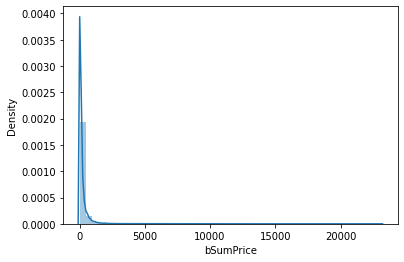

The distribution of bSumPrice features is given below.



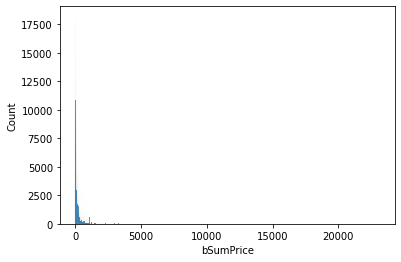

In [57]:
##### Show the distribution of bSumPrice features #####
print('The distribution of bSumPrice features is given below.\n')
sns.distplot(df.loc[:, 'bSumPrice'])
plt.show()

##### Show the histogram of bSumPrice features #####
print('The distribution of bSumPrice features is given below.\n')
sns.histplot(df.loc[:, 'bSumPrice'], kde = False)
plt.show()

In [58]:
##### Find out a query that, how many clicked items has been placed based on sum price that put in the basket #####
def find_items(group):
  return group['bSumPrice'].count()
df.groupby(['order', 'cCount']).apply(find_items)

order  cCount
0      0             0
       1          9883
       2         11967
       3         11355
       4          7725
                 ...  
1      196          35
       197          41
       198          55
       199          26
       200          12
Length: 402, dtype: int64

The distribution of bStep is given below.



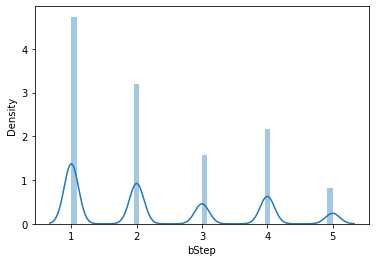

************************************************************************************************************************
The number of unique value of this bStep is:  5


In [59]:
##### Show the distribution of bStep - Processing the step #####
print('The distribution of bStep is given below.\n')
sns.distplot(df.loc[:, 'bStep'])
plt.show()
print('*'*120)

print('The number of unique value of this bStep is: ', df.loc[:, 'bStep'].nunique())

The countplot of the online status is given below.



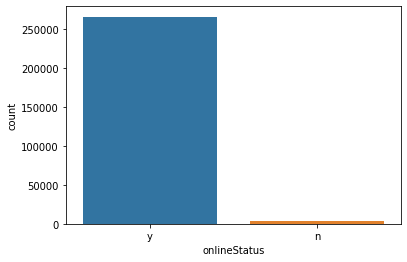

In [60]:
##### show the countplot of onlineStatus #####
print("The countplot of the online status is given below.\n")
sns.countplot(df.loc[:, 'onlineStatus'])
plt.show()

The countplot of the availability is given below.



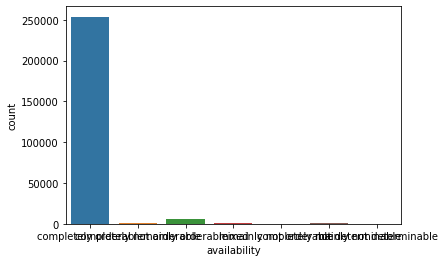

************************************************************************************************************************
The unique value of this column is [nan 'completely orderable' 'completely not orderable' 'mainly orderable'
 'mixed' 'mainly not orderable' 'completely not determinable'
 'mainly not determinable']


In [61]:
##### show the countplot of availability #####
print("The countplot of the availability is given below.\n")
sns.countplot(df.loc[:, 'availability'])
plt.show()
print('*'*120)

##### Show the unique value of this column #####

print("The unique value of this column is {}".format(df.loc[:, 'availability'].unique()))

The distribution of maxVal is given below.



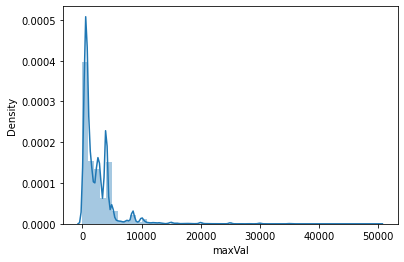

************************************************************************************************************************
The customer ID of those customers who did the maxVal Int64Index([118416, 118417, 118418, 118419, 118420, 164038, 164039, 164040,
            164041, 164042, 164043, 164044, 164045, 164046, 164047, 164048,
            164049, 164050, 164051, 164052, 164053, 164054, 164055, 164056,
            164057],
           dtype='int64')
************************************************************************************************************************
The customer ID of those customers who did the minVal Int64Index([  1195,   1196,   1197,   4964,   4965,   4966,   4967,   4968,
              4969,   4970,
            ...
            400209, 400210, 400211, 400212, 410429, 410430, 410431, 422387,
            422388, 422389],
           dtype='int64', length=1260)
***************************************************************************************************************

In [62]:
##### The distribution of maxVal #####
print('The distribution of maxVal is given below.\n')
sns.distplot(df.loc[:, 'maxVal'])
plt.show()
print('*'*120)

##### Which customer did the maxVal #####
print("The customer ID of those customers who did the maxVal {}". format(df[df.loc[:, 'maxVal'].max() == df.loc[:, 'maxVal']].index))
print('*'*120)

##### Which customer did the minVal #####
print("The customer ID of those customers who did the minVal {}". format(df[df.loc[:, 'maxVal'].min() == df.loc[:, 'maxVal']].index))
print('*'*120)

In [63]:
##### Find out a query, how many clicked items they clicked as well as items that put in busket based on top maxVal #####

top_10_unique_maxVal_    = df.loc[:, 'maxVal'].drop_duplicates().sort_values(ascending = False).head(10).index
top_10_unique_maxVal_df_ = df[df.index.isin(top_10_unique_maxVal_)]
top_10_unique_maxVal_df_

#### Rest of code is given next cell ####

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,availability,customerNo,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,order
11714,9,5,5300.671,3,9.99,9.99,9.99,1,9.99,9.99,...,NaN,726.0,30000.0,529.0,60.0,102.0,41.0,2.0,10.0,1
13902,9,5,0.000,1,39.99,39.99,39.99,1,39.99,39.99,...,NaN,857.0,25000.0,553.0,348.0,232.0,58.0,1.0,10.0,0
20427,10,5,2707.033,4,9.20,17.99,36.39,1,9.20,9.20,...,NaN,1260.0,45000.0,508.0,213.0,486.0,55.0,1.0,10.0,1
31132,11,5,1369.096,13,44.00,54.95,368.74,1,54.95,54.95,...,NaN,1890.0,28000.0,548.0,152.0,152.0,62.0,2.0,10.0,1
45579,12,5,19.516,5,5.00,34.99,84.98,1,5.00,5.00,...,NaN,2759.0,35000.0,516.0,70.0,521.0,53.0,2.0,11.0,1
100580,18,5,14.399,2,65.99,65.99,131.98,1,65.99,65.99,...,NaN,5945.0,26600.0,533.0,289.0,157.0,47.0,2.0,11.0,1
118416,19,5,0.000,1,39.99,39.99,39.99,1,39.99,39.99,...,NaN,6959.0,50000.0,495.0,10.0,139.0,70.0,1.0,10.0,0
175287,10,6,125.008,5,9.99,14.99,64.95,1,14.99,14.99,...,NaN,10015.0,40000.0,530.0,123.0,404.0,44.0,1.0,4.0,1
331470,10,7,11.332,3,69.99,69.99,209.97,1,69.99,69.99,...,NaN,19118.0,36500.0,460.0,60.0,107.0,32.0,1.0,4.0,0
398387,16,7,0.000,1,3.99,3.99,3.99,1,3.99,3.99,...,NaN,23259.0,26700.0,511.0,182.0,14.0,56.0,1.0,13.0,1


In [64]:
##### Rest of code is here #####
top_10_unique_maxVal_df_.groupby(['order']).agg({
    'cCount':['min', 'max', 'mean', 'count'],
    'bCount':['min', 'max', 'mean', 'count']
})

cCount                     bCount               
         min max      mean count    min max mean count
order                                                 
0          1   3  1.666667     3      1   1  1.0     3
1          1  13  4.714286     7      1   1  1.0     7

The distribution of customer score is given below.



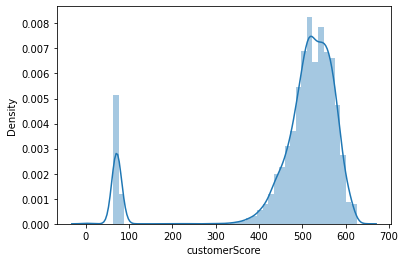

************************************************************************************************************************
The relationship of online status and customer score is given below.



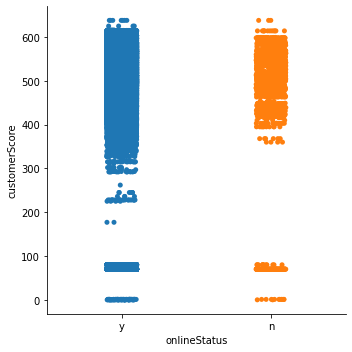

************************************************************************************************************************
The relationship of online status and customer score with order purchase is given below.



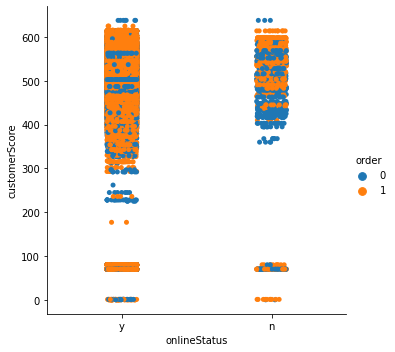

************************************************************************************************************************
The relationship of online status and customer score with order purchase is given below.



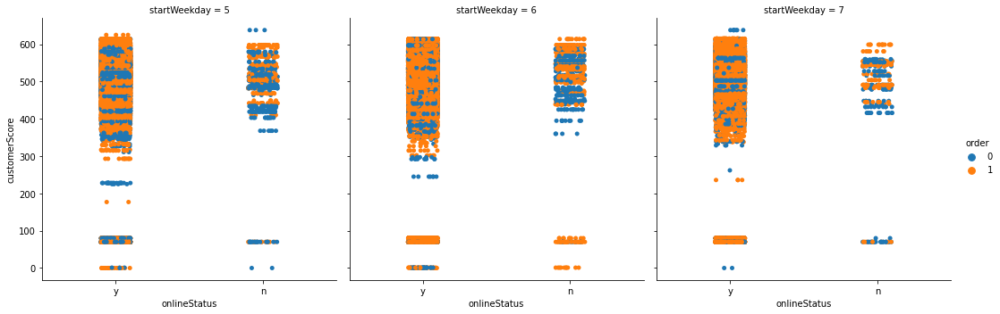

************************************************************************************************************************
The relationship of customer score with the number of product that put in the basket is given below.



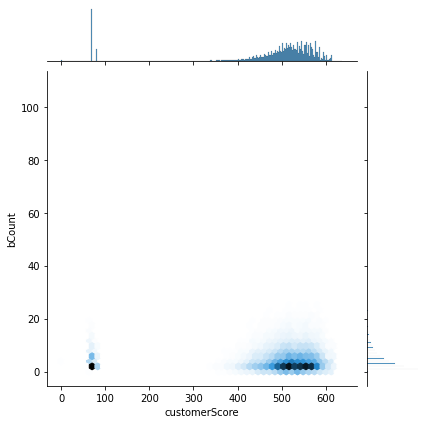

In [65]:
##### The distribution of customerScore #####
print('The distribution of customer score is given below.\n')
sns.distplot(df.loc[:, 'customerScore'])
plt.show()
print('*'*120)

#####The relationship of online status and customer score #####
print('The relationship of online status and customer score is given below.\n')
sns.catplot(x = 'onlineStatus', y = 'customerScore', data = df)
plt.show()
print('*'*120)

##### The relationship of online status and customer score with order purchase #####
print('The relationship of online status and customer score with order purchase is given below.\n')
sns.catplot(x = 'onlineStatus', y = 'customerScore', hue = 'order', data = df)
plt.show()
print('*'*120)

##### The relationship of online status and customer score with order purchase #####
print('The relationship of online status and customer score with order purchase is given below.\n')
sns.catplot(x = 'onlineStatus', y = 'customerScore', hue = 'order', col = 'startWeekday', data = df)
plt.show()
print('*'*120)

##### The relationship of customer score with the number of product that put in the basket #####
print('The relationship of customer score with the number of product that put in the basket is given below.\n')
sns.jointplot(x = 'customerScore', y = 'bCount', data = df, kind = 'hex')
plt.show()

The distribution of accountLifetime is given below.



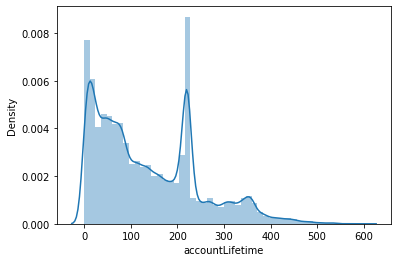

The relationship between of accountLifetime and customerScore is given below.



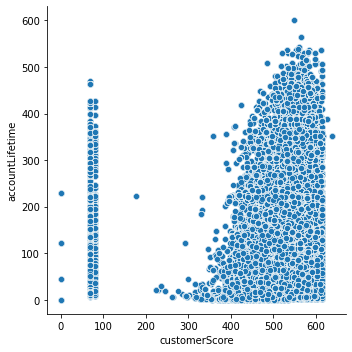

The relationship between of accountLifetime and customerScore with order is given below.



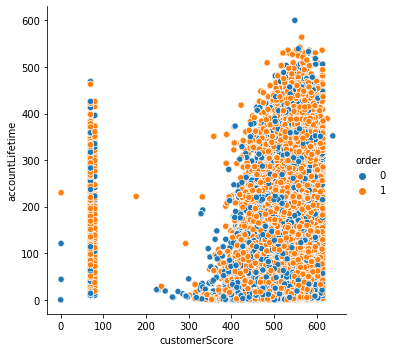

In [66]:
##### The distribution of accountLifetime #####
print('The distribution of accountLifetime is given below.\n')
sns.distplot(df.loc[:, 'accountLifetime'])
plt.show()

##### Show the relationship of accountLifetime and customerScore #####
print('The relationship between of accountLifetime and customerScore is given below.\n')
sns.relplot(x = 'customerScore', y = 'accountLifetime', data = df)
plt.show()

##### Show the relationship of accountLifetime and customerScore with order #####
print('The relationship between of accountLifetime and customerScore with order is given below.\n')
sns.relplot(x = 'customerScore', y = 'accountLifetime', hue = 'order', data = df)
plt.show()

1    69462
0    14874
Name: order, dtype: int64 




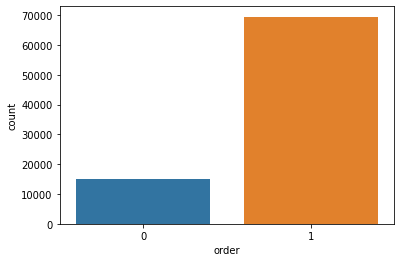

In [67]:
##### Find out, how many orders placed based on greater mean customerScore and accountLifetime ####
used_account_ = df[df.loc[:,'accountLifetime'] > df.loc[:,'accountLifetime'].mean()]
print(used_account_[used_account_.loc[:, 'customerScore'] > used_account_.loc[:, 'customerScore'].mean()]['order'].value_counts(),'\n\n')
sns.countplot(used_account_[used_account_.loc[:, 'customerScore'] > used_account_.loc[:, 'customerScore'].mean()]['order'])

The distribution of age feature is given below.



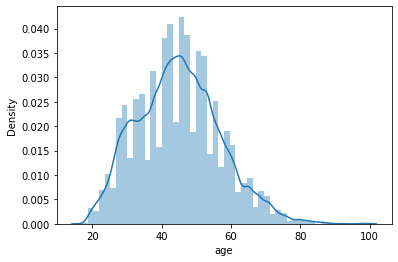

************************************************************************************************************************
The relationship of age and customerScore is given below.



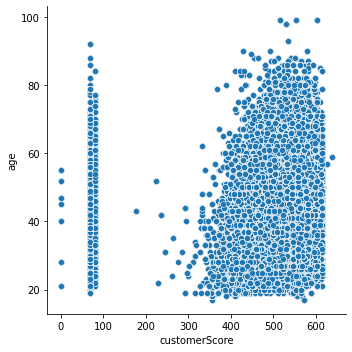

The relationship of age and customerScore with order is given below.



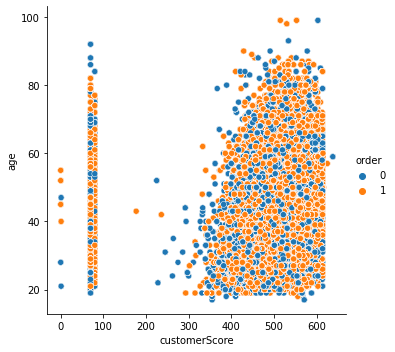

The relationship of age and customerScore with order is given below.



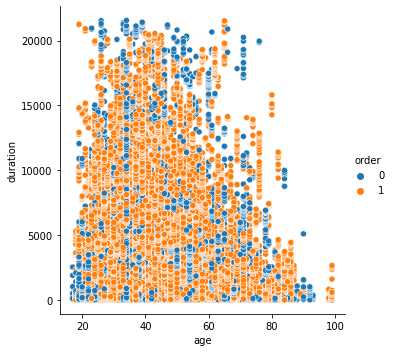

In [68]:
##### The distribution of age #####
print('The distribution of age feature is given below.\n')
sns.distplot(df.loc[:, 'age'])
plt.show()
print('*'*120)

##### Show the distribution of age and customerScore #####
print('The relationship of age and customerScore is given below.\n')
sns.relplot(x = 'customerScore', y = 'age', data = df)
plt.show()

##### Show the distribution of age and customerScore with order #####
print('The relationship of age and customerScore with order is given below.\n')
sns.relplot(x = 'customerScore', y = 'age', hue = 'order', data = df)
plt.show()

##### Show the distribution of age and duration with order #####
print('The relationship of age and customerScore with order is given below.\n')
sns.relplot(x = 'age', y = 'duration', hue = 'order', data = df)
plt.show()

The countplot of the address is given below.



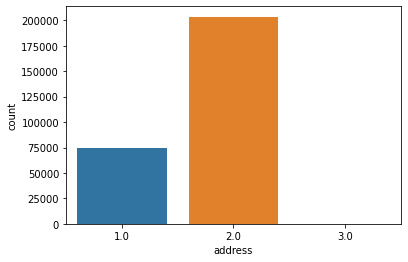

************************************************************************************************************************
1 means Mr, 2 means Mrs and 3 means company.

************************************************************************************************************************


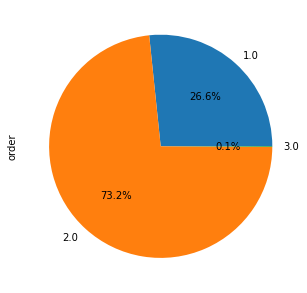

It is clearly see that, Female did online shop most.



In [69]:
##### Plot the value counts of address of this dataset #####
print('The countplot of the address is given below.\n')
sns.countplot(df.loc[:, 'address'])
plt.show()
print('*'*120)

print('1 means Mr, 2 means Mrs and 3 means company.\n')
print('*'*120)

##### Find out which gender order online product most #####
plt.figure(figsize = (5, 8))
df.groupby(['address'])['order'].count().plot(kind = 'pie', autopct='%1.1f%%')
plt.show()

print('It is clearly see that, Female did online shop most.\n')

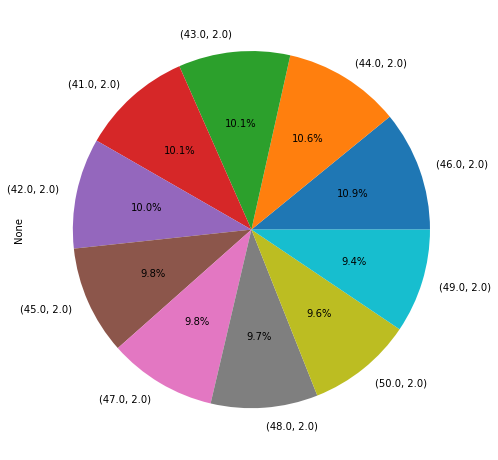

In [70]:
##### Find out, what the age ratio of gender in online shopping #####
plt.figure(figsize = (8, 10))
def find_ratio(group):
  return group['bCount'].count()

df.groupby(['age', 'address']).apply(find_ratio).sort_values(ascending = False).head(10).plot(kind = 'pie', autopct='%1.1f%%')

plt.show()

The distribution of lastOrder is given below.



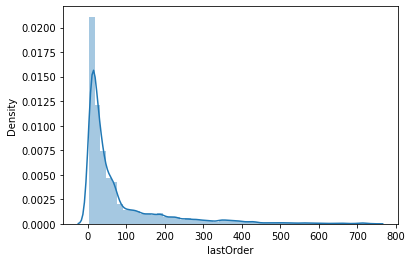

************************************************************************************************************************
The relationship of lastOrder and accountLifetime is given below.



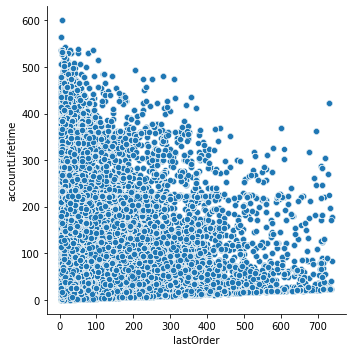

************************************************************************************************************************
The relationship of lastOrder and accountLifetime with order is given below.



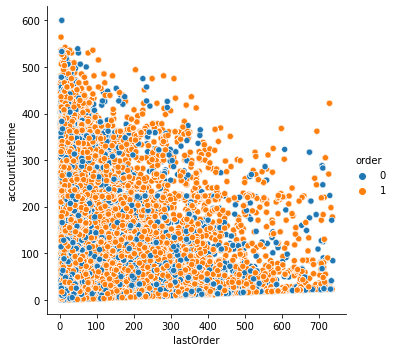

************************************************************************************************************************
The relationship of lastOrder and accountLifetime with order is given below.



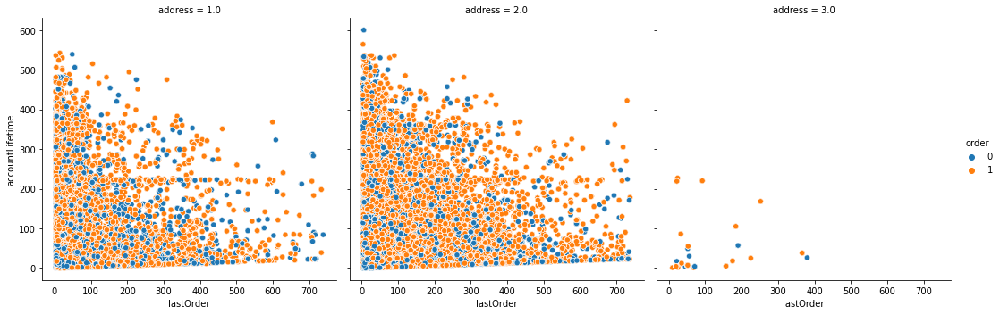

************************************************************************************************************************


In [71]:
##### The distribution of lastOrder #####
print('The distribution of lastOrder is given below.\n')
sns.distplot(df.loc[:, 'lastOrder'])
plt.show()
print('*'*120)

##### The relationship of lastOrder and accountLifetime #####
print('The relationship of lastOrder and accountLifetime is given below.\n')
sns.relplot(x = 'lastOrder', y = 'accountLifetime', data = df)
plt.show()
print('*'*120)

##### The relationship of lastOrder and accountLifetime with order #####
print('The relationship of lastOrder and accountLifetime with order is given below.\n')
sns.relplot(x = 'lastOrder', y = 'accountLifetime', hue = 'order', data = df)
plt.show()
print('*'*120)

##### The relationship of lastOrder and accountLifetime with order #####
print('The relationship of lastOrder and accountLifetime with order is given below.\n')
sns.relplot(x = 'lastOrder', y = 'accountLifetime', hue = 'order', col = 'address', data = df)
plt.show()
print('*'*120)

address
1.0     74058
2.0    203570
3.0       287
Name: lastOrder, dtype: int64 




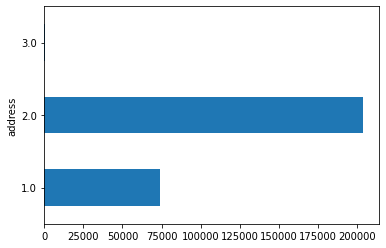

In [72]:
##### Find a query, which gender mostly ordered last #####

print(df.groupby(['address'])['lastOrder'].count(),'\n\n')

##### Show it in countplot #####

df.groupby(['address'])['lastOrder'].count().plot(kind = 'barh')
plt.show()

In [73]:
##### Find out, in which generation with gender how many lastOrder has been placed ####
plt.figure(figsize = (6, 8))
def find_ratio(group):
  return group.groupby(['age'])['lastOrder'].count().sort_values(ascending = False).head(5)

df.groupby(['address']).apply(find_ratio)

address  age 
1.0      53.0    3150
         45.0    2776
         43.0    2417
         42.0    2316
         40.0    2308
2.0      46.0    7526
         44.0    7327
         43.0    6980
         41.0    6967
         42.0    6908
3.0      30.0      46
         44.0      45
         29.0      32
         28.0      26
         38.0      24
Name: lastOrder, dtype: int64

<Figure size 432x576 with 0 Axes>

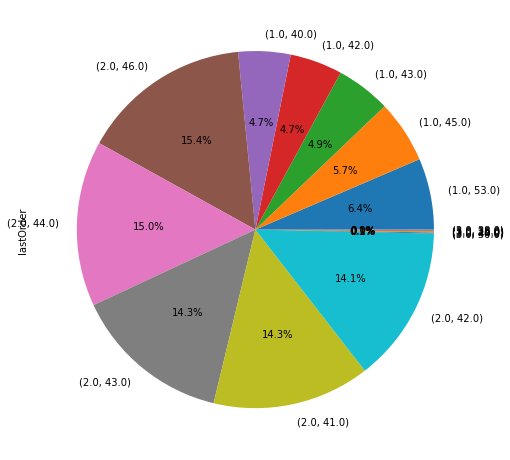

In [74]:
##### Find out, in which generation with gender how many lastOrder has been placed ####
plt.figure(figsize = (8, 10))

def find_ratio(group):
  return group.groupby(['age'])['lastOrder'].count().sort_values(ascending = False).head(5)

df.groupby(['address']).apply(find_ratio).plot(kind = 'pie',  autopct='%1.1f%%')

plt.show()

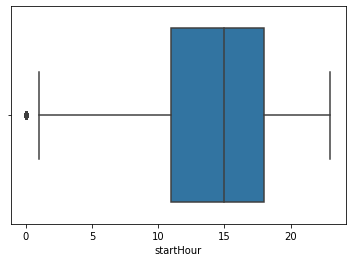

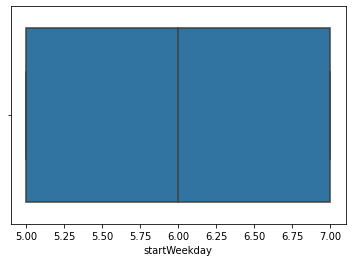

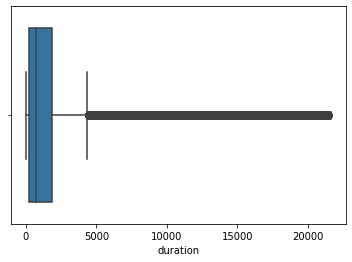

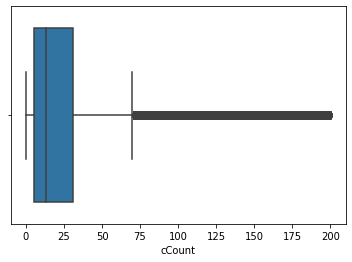

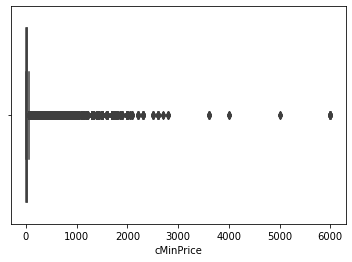

...

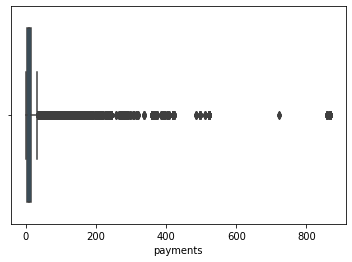

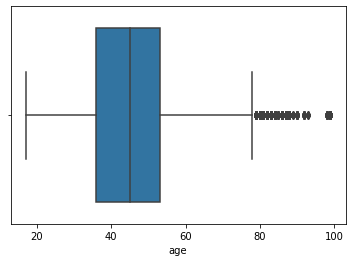

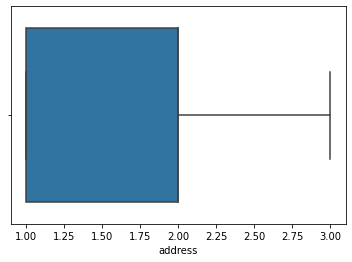

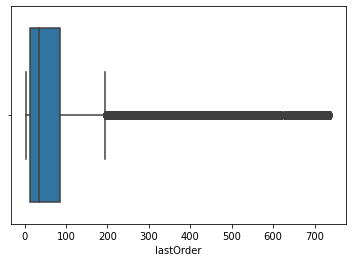

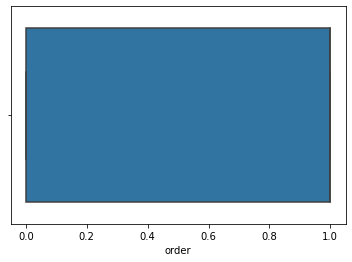

In [75]:
##### Outliers in the dataset #####
for column_ in df.dtypes[df.dtypes != 'object'].index:
  sns.boxplot(column_, data = df)
  plt.show()

In [76]:
##### Comments after analyse #####
print('There is a lot of outliers in the features of this dataset')

There is a lot of outliers in the features of this dataset


Feature Enginerring Technique for fit the model.

In [77]:
##### Find the duplicates records in this dataset or not #####
if df.duplicated().sum().sum() > 0:
  print('There is duplicate values in this dataset. The number of duplicate value in this dataset is {}'.format(df.duplicated().sum().sum()))
else:
  print('No duplicate value in this dataset.')

There is duplicate values in this dataset. The number of duplicate value in this dataset is 4731


In [78]:
##### Drop the duplicated values #####
df.drop_duplicates(inplace = True)
print("Duplicated value has been deleted.\n")

if df.duplicated().sum().sum() > 0:
  print('There is duplicate values in this dataset. The number of duplicate value in this dataset is {}'.format(df.duplicated().sum().sum()))
else:
  print('No duplicate value in this dataset.')

Duplicated value has been deleted.

No duplicate value in this dataset.


In [79]:
df.isnull().sum()

startHour               0
startWeekday            0
duration                0
cCount                  0
cMinPrice            2018
cMaxPrice            2018
cSumPrice            2018
bCount                  0
bMinPrice            4383
bMaxPrice            4383
bSumPrice            4383
bStep              186669
onlineStatus       155723
availability       160599
customerNo         146973
maxVal             149615
customerScore      149615
accountLifetime    149615
payments           146973
age                147271
address            146973
lastOrder          146973
order                   0
dtype: int64

In [80]:
##### Mean Imputation for preventing the NaN value #####
mean_imputation_column_ = ['cMinPrice', 'cMaxPrice', 'cSumPrice', 'bMinPrice', 'bMaxPrice', 'bSumPrice']

def mean_imputation(column_):
  df.loc[:, column_].fillna(df.loc[:, column_].mean(), inplace = True)
  print(f'{column_} is Done.\n')

for column_ in mean_imputation_column_:
  mean_imputation(column_)

cMinPrice is Done.

cMaxPrice is Done.

cSumPrice is Done.

bMinPrice is Done.

bMaxPrice is Done.

bSumPrice is Done.



In [81]:
##### Copy the dataset #####
check_df = df.copy()

In [82]:
##### Capturing NaN value with a new feature and random sample inputation #####
capturing_NaN_list_ = list(df.isnull().sum()[df.isnull().sum()>0].index)
print('The list is {}'.format(capturing_NaN_list_),'\n\n')

def capture_NaN_with_new_feature(column_, index_):
  df[column_+str(index_)+"_"] = np.where(df.loc[:, column_].isnull().sum(), 1, 0)
  print(f'{column_} is done.\n')

for index_, column_ in enumerate(capturing_NaN_list_):
  capture_NaN_with_new_feature(column_, index_)

print('*'*120)
print('The shape of previous dataset is {}'.format(check_df.shape),'\n')
print('The shape of new dataset is {}'.format(df.shape))

The list is ['bStep', 'onlineStatus', 'availability', 'customerNo', 'maxVal', 'customerScore', 'accountLifetime', 'payments', 'age', 'address', 'lastOrder'] 


bStep is done.

onlineStatus is done.

availability is done.

customerNo is done.

maxVal is done.

customerScore is done.

accountLifetime is done.

payments is done.

age is done.

address is done.

lastOrder is done.

************************************************************************************************************************
The shape of previous dataset is (424282, 23) 

The shape of new dataset is (424282, 34)


In [83]:
##### Generate the function of random sample imputation #####
def random_sample_imputation(df, variable):
  random_values_ = df.loc[:, variable].dropna().sample(df.loc[:, variable].isnull().sum(), random_state = 0).values
  random_index_  = df.loc[:, variable].dropna().sample(df.loc[:, variable].isnull().sum(), random_state = 0).index

  print(random_values_,'\n\n')
  print(random_index_, '\n\n')
  print('*'*120)

  ramdom_sample = df.loc[:, variable].dropna().sample(df.loc[:, variable].isnull().sum(), random_state = 0)
  ramdom_sample.index = df[df[variable].isnull()].index
  df.loc[df[variable].isnull(), variable] = ramdom_sample

random_sample_ = list(df.isnull().sum()[df.isnull().sum()>0].index)

for variable_ in random_sample_:
  random_sample_imputation(df, variable_)
  print(f'{variable_} is done.\n')

[1. 4. 5. ... 3. 1. 1.] 


Int64Index([231956,   7704, 296355, 333944,  42145, 110960,  14680,  81323,
             75160,  67623,
            ...
            268141, 190791, 319138,  36462, 308442,  55986, 212658,  40570,
            366230, 354069],
           dtype='int64', length=186669) 


************************************************************************************************************************
bStep is done.

['y' 'y' 'y' ... 'y' 'y' 'y'] 


Int64Index([312065, 102955, 156238,  68342, 298172, 103140, 409309, 153771,
            161700, 415265,
            ...
            282110, 425513, 186045,  67393,  47081, 196160,  18864, 280150,
            224174, 107354],
           dtype='int64', length=155723) 


************************************************************************************************************************
onlineStatus is done.

['completely orderable' 'completely orderable' 'completely orderable' ...
 'completely orderable' 'completely orderable' 

In [84]:
##### Check NaN value removed or not #####
if df.isnull().sum().sum() == 0:
  print('NaN value is removed.')
else:
  print('NaN value in this dataset.')

NaN value is removed.


In [85]:
##### Remove customerID and availability column #####
df.drop(['availability'], axis = 1, inplace = True)
print(f' availability column has been deleted.')

 availability column has been deleted.


Scaling the dataset and split it train and test

In [86]:
##### Drop the target column #####
y = df.loc[:, 'order']
df.drop(['order'], axis = 1, inplace = True)
print('The order column has been deleted.\n')
X = df.iloc[:]

print('The shape of X is {}'.format(X.shape))

The order column has been deleted.

The shape of X is (424282, 32)


In [87]:
##### Handing the categorical data #####
df_dummies_ = pd.get_dummies(data = df, drop_first = True)
df_dummies_.head()

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,...,availability2_,customerNo3_,maxVal4_,customerScore5_,accountLifetime6_,payments7_,age8_,address9_,lastOrder10_,onlineStatus_y
0,6,5,0.000,1,59.990000,59.990000,59.990000,1,59.9900,59.990000,...,1,1,1,1,1,1,1,1,1,1
1,6,5,11.940,1,59.990000,59.990000,59.990000,1,59.9900,59.990000,...,1,1,1,1,1,1,1,1,1,1
2,6,5,39.887,1,59.990000,59.990000,59.990000,1,59.9900,59.990000,...,1,1,1,1,1,1,1,1,1,1
3,6,5,0.000,0,55.224206,147.305622,1199.269904,0,67.6771,107.779763,...,1,1,1,1,1,1,1,1,1,1
4,6,5,15.633,0,55.224206,147.305622,1199.269904,0,67.6771,107.779763,...,1,1,1,1,1,1,1,1,1,1


In [88]:
##### Scaling the dataset using StandardScaler #####
standard_scaler_ = StandardScaler()
X_scaled = standard_scaler_.fit_transform(df_dummies_)

# ##### Train and test dataset #####
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (296997, 32)
X_test  shape is (127285, 32)
y_train shape is (296997,)
y_test  shape is (127285,)


Use Machine Learning Algorithm to evaluate the model.

In [89]:
##### Models in a list #####
ml_models_ = {'NB': GaussianNB(), 'BNB': BernoulliNB(), 'SGD': SGDClassifier(), 'MLP': MLPClassifier(), 'LR': LogisticRegression(),
              'Perceptron': Perceptron(), 'DT': DecisionTreeClassifier(), 
              'RF': RandomForestClassifier(),'Adaboost': AdaBoostClassifier(), 'GB': GradientBoostingClassifier(), 'XGB': XGBClassifier()}

##### Run the model and check the perfprmance #####

performance_list_    = []

for key_, value_ in ml_models_.items():

  dataframe_dictonary_ = {}

  classifier_ = value_.fit(X_train, y_train)
  predicted_  = classifier_.predict(X_test)

  print('{} classifier is running:\n'.format(key_).upper())

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

  print("Precision score = ".title(), precision_score(predicted_, y_test))
  dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

  print("recall score    = ".title(), recall_score(predicted_, y_test))
  dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

  print("f1_score        = ".title(), f1_score(predicted_, y_test))
  dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

  print('*'*40,'\n')

  ##### Append this into performance list #####
  performance_list_.append(pd.DataFrame(dataframe_dictonary_, index = [key_.upper()]))

NB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6809600502808658
Precision Score =  0.9195000749426401
Recall Score    =  0.7034080685847343
F1_Score        =  0.7970676274667561
**************************************** 

BNB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6747220803708214
Precision Score =  0.8632354467157829
Recall Score    =  0.717072750258591
F1_Score        =  0.7833948049909755
**************************************** 

SGD CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6828534391326551
Precision Score =  0.9893120265642835
Recall Score    =  0.685094253754581
F1_Score        =  0.8095669402773847
**************************************** 

MLP CLASSIFIER IS RUNNING:

Accuracy Score  =  0.7392544290372
Precision Score =  0.8784084489179436
Recall Score    =  0.7708894060507943
F1_Score        =  0.8211443013962912
**************************************** 

LR CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6895706485446046
Precision Score =  0.9670021791013801
Recall Scor

In [90]:
##### Show the performance of Ml algorithms in the DataFrame format #####
pd.concat(performance_list_)

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
NB,0.680960,0.919500,0.703408,0.797068
BNB,0.674722,0.863235,0.717073,0.783395
SGD,0.682853,0.989312,0.685094,0.809567
MLP,0.739254,0.878408,0.770889,0.821144
LR,0.689571,0.967002,0.695898,0.809351
PERCEPTRON,0.532011,0.550091,0.698991,0.615666
DT,0.788930,0.847832,0.843262,0.845541
RF,0.860604,0.954700,0.857025,0.903229
ADABOOST,0.704631,0.918163,0.723080,0.809027
GB,0.721703,0.935250,0.731284,0.820786


In [91]:
##### Comments after analyse #####
print('Among all classifier, Random Forest classifier is the best.')

Among all classifier, Random Forest classifier is the best.


Using GridSearchCV to find out the best parameters for the Random Forest Classifier 

In [92]:
# ##### Now use the GridSearchCV to find out the best parameters #####

# param_grid_ = {
#     'n_estimators': [100, 150, 200],
#      'criterion'  : ['gini', 'entropy', 'log_loss'],
#      'max_depth'  : [10, 15, 20],
#      'min_samples_split': [2, 3, 4],
#      'max_features': ['sqrt', 'log2'],
#      'class_weight': ['balanced', 'balanced_subsample']
# }

# GridSearchCV_ = GridSearchCV(estimator = RandomForestClassifier(), param_grid = param_grid_, cv = 5)
# ##### Fit the train dataset into the GridSearch #####
# GridSearchCV_.fit(X_train, y_train)

In [93]:
# ##### show the best score of this GridSearchCV #####
# print('The best score of this tuning GridSearchCV {}'.format(GridSearchCV_.best_score_),'\n')

# ##### Find the best parameters of this tuning #####
# print('The best parameters of this GridSearchCV {}'.format(GridSearchCV_.best_params_))

In [94]:
##### Use the best parameters to train the model in Random Forest #####

Delete all missing values from the dataset and check the model perforamce

In [128]:
##### Import the dataset #####
df_check = pd.read_csv('/content/transact_train.txt', delimiter = '|', na_values = ['?', '??'])

##### Drop all NaN value from the dataset #####
df_check.dropna(inplace = True, axis = 0)

##### Convert the target class #####
df_check.loc[:, 'order'] = df_check.loc[:, 'order'].map({'y': 1, 'n': 0})


##### Take the target class ####
y_new = df_check.loc[:, 'order']

##### Drop it from the dataframe #####
df_check.drop(['order'], axis = 1, inplace = True)
df_check.drop(['customerNo'], axis = 1, inplace = True)
df_check.drop(['availability'], axis = 1, inplace = True)
df_check.drop(['sessionNo'], axis = 1, inplace = True)

##### Handle the categorical data #####
df_check = pd.get_dummies(data = df_check, drop_first = True)

##### Take the train #####
X_ = df_check.loc[:]

##### Preprocessing the dataset #####
standard_scaler_ = StandardScaler()
X_new = standard_scaler_.fit_transform(X_)
X_new = pd.DataFrame(X_new, index = y_new.index)

##### Split the dataset into train and test #####

X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (98814, 20)
X_test  shape is (42349, 20)
y_train shape is (98814,)
y_test  shape is (42349,)


In [96]:
##### Models in a list #####
ml_models_ = {'NB': GaussianNB(), 'BNB': BernoulliNB(), 'SGD': SGDClassifier(), 'MLP': MLPClassifier(), 'LR': LogisticRegression(),
              'Perceptron': Perceptron(), 'DT': DecisionTreeClassifier(), 
              'RF': RandomForestClassifier(),'Adaboost': AdaBoostClassifier(), 'GB': GradientBoostingClassifier(), 'XGB': XGBClassifier()}

##### Run the model and check the perfprmance #####

performance_list_    = []

for key_, value_ in ml_models_.items():

  dataframe_dictonary_ = {}

  classifier_ = value_.fit(X_train, y_train)
  predicted_  = classifier_.predict(X_test)

  print('{} classifier is running:\n'.format(key_).upper())

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

  print("Precision score = ".title(), precision_score(predicted_, y_test))
  dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

  print("recall score    = ".title(), recall_score(predicted_, y_test))
  dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

  print("f1_score        = ".title(), f1_score(predicted_, y_test))
  dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

  print('*'*40,'\n')

  ##### Append this into performance list #####
  performance_list_.append(pd.DataFrame(dataframe_dictonary_, index = [key_.upper()]))

NB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.7907624737301944
Precision Score =  0.927607717974757
Recall Score    =  0.8339419866444073
F1_Score        =  0.8782846389472673
**************************************** 

BNB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.7764528088030413
Precision Score =  0.9027419120847237
Recall Score    =  0.8357419146878693
F1_Score        =  0.8679508459682255
**************************************** 

SGD CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8147299818177525
Precision Score =  0.9931234585811693
Recall Score    =  0.8181274948012525
F1_Score        =  0.8971717648292313
**************************************** 

MLP CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8477177737372783
Precision Score =  0.9622805744958653
Recall Score    =  0.8656104818082163
F1_Score        =  0.9113892743785983
**************************************** 

LR CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8159342605492456
Precision Score =  0.9930944436384738
Recall 

In [97]:
##### Show the performance of Ml algorithms in the DataFrame format #####
pd.concat(performance_list_)

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
NB,0.790762,0.927608,0.833942,0.878285
BNB,0.776453,0.902742,0.835742,0.867951
SGD,0.814730,0.993123,0.818127,0.897172
MLP,0.847718,0.962281,0.865610,0.911389
LR,0.815934,0.993094,0.819141,0.897769
PERCEPTRON,0.758271,0.888844,0.827052,0.856835
DT,0.923351,0.950530,0.955074,0.952796
RF,0.965855,0.998810,0.960786,0.979429
ADABOOST,0.820444,0.988365,0.825454,0.899593
GB,0.826891,0.996141,0.826680,0.903533


In [98]:
print('It is clearly see that, after deleting the NaN records from the dataset the performance has been increased. WOW !!!')

It is clearly see that, after deleting the NaN records from the dataset the performance has been increased. WOW !!!


Use PCA - Principal Component Analysis for feature extraction.

In [99]:
##### Use PCA - Principal Component Analysis #####
PCA_ = PCA(n_components = None)
##### PCA result is given below ####
PCA_.fit_transform(X_new)

array([[-1.13683751e-01, -1.40173752e+00, -2.16884508e+00, ...,
        -1.04038990e-01, -4.70237106e-03, -3.24314890e-02],
       [-7.97775876e-01, -1.30027030e+00,  7.19555548e-01, ...,
         1.16908521e-01,  1.88650735e-02, -9.03503247e-03],
       [-1.95818250e-01,  3.20218473e-01, -4.22629322e-01, ...,
         2.19845771e-01, -1.90492116e-01,  9.28792948e-02],
       ...,
       [-6.88386144e-01,  2.29114506e+00, -3.20664826e-01, ...,
        -4.47139118e-01,  8.77877598e-02,  5.84519780e-03],
       [-6.88087941e-01,  2.29476464e+00, -3.20443998e-01, ...,
        -4.48638867e-01,  8.78180746e-02,  5.84728431e-03],
       [-9.17141568e-01, -5.46212422e-01, -7.52839194e-01, ...,
         1.30929927e-01,  2.05936824e-03, -1.89666993e-02]])

In [100]:
print('PCA Components is {}'.format(PCA_.components_),'\n\n')
print('*'*120)
print('PCA Explained Variance is {}'.format(PCA_.explained_variance_),'\n\n')
print('*'*120)
print('PCA Explained Variance Ratio {}'.format(PCA_.explained_variance_ratio_))

PCA Components is [[ 5.02006787e-03 -2.85654941e-02  4.07937745e-02 -6.54397524e-03
   3.98423777e-01  4.20749971e-01  3.18869671e-01 -3.28888249e-02
   4.26385704e-01  4.60838202e-01  3.93102874e-01  7.56777278e-03
  -3.32897268e-02 -3.09466770e-02 -3.96792695e-02 -2.65627358e-02
  -3.33995133e-02 -5.39766737e-02  3.72356814e-02 -1.98766508e-02]
 [ 1.21545184e-02 -1.08702966e-02  4.95153684e-01  5.65571339e-01
  -2.01387954e-01  5.85402909e-02  2.60049020e-01  4.71173202e-01
  -1.78691684e-01 -3.73759843e-02  1.51433550e-01 -6.71686890e-02
  -3.47670959e-02 -4.92236168e-03 -9.27600195e-02  4.68315833e-02
  -1.30663321e-01  7.27058313e-02 -1.92507668e-04 -7.68838609e-02]
 [-4.05050624e-02 -2.34414722e-02  3.02090254e-02 -4.78110281e-03
   4.85903241e-03  3.89133095e-02  2.05506338e-02  1.47034683e-01
   5.33115848e-03  5.36385694e-02  7.55290117e-02  1.60657132e-01
   4.88587729e-01  3.65041161e-01  3.99787699e-01  3.76040903e-01
   3.54348330e-01  2.58181633e-03 -3.73892357e-01  1.729

cumsum of numpy is [0.20316981 0.116356   0.10639389 0.06445571 0.06013903 0.05877109
 0.05011587 0.04820233 0.04750251 0.04055688 0.03780657 0.03490205
 0.0276409  0.02491806 0.02107667 0.02084418 0.01566813 0.01252486
 0.00544529 0.00351017] 

************************************************************************************************************************


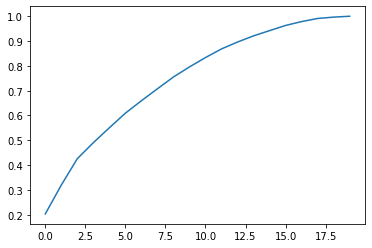

In [101]:
##### Find out 90% variance of PCA #####
print('cumsum of numpy is {}'.format(PCA_.explained_variance_ratio_),'\n')
print('*'*120)
plt.plot(np.cumsum(PCA_.explained_variance_ratio_))
plt.show()

In [102]:
##### PCA performed used with number of components = 14 ####
PCA_ = PCA(n_components = 14)
X_new_scaled_ = PCA_.fit_transform(X_new)
X_new_scaled_ = pd.DataFrame(X_new_scaled_, index = [y_new.index])
X_new_scaled_.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
1,-0.113684,-1.401738,-2.168845,1.080649,1.843209,0.310009,0.411977,-0.821826,0.232148,-2.014395,0.366581,0.866521,-2.177874,-0.860131
11,-0.797776,-1.300270,0.719556,0.325586,0.452275,-0.189762,1.022475,-1.195178,-0.870437,-2.151317,0.108147,0.935416,0.008289,-1.213893
20,-0.195818,0.320218,-0.422629,1.332695,0.223597,-0.317561,1.080892,-1.566770,-0.993987,-2.139684,0.124193,0.554732,-0.111179,0.231658
21,-0.194864,0.331803,-0.421923,1.333845,0.225410,-0.317704,1.083189,-1.568744,-0.995947,-2.143383,0.122901,0.542075,-0.110728,0.233552
27,-0.981635,-0.797392,-0.934463,1.392610,-1.073349,-1.208078,-0.735754,0.275634,0.848997,-1.947674,0.523464,0.622385,0.153469,-0.034227


In [103]:
##### Split the dataset into train and test #####

X_train, X_test, y_train, y_test = train_test_split(X_new_scaled_, y_new, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (98814, 14)
X_test  shape is (42349, 14)
y_train shape is (98814,)
y_test  shape is (42349,)


In [104]:
##### Models in a list #####
ml_models_ = {'NB': GaussianNB(), 'BNB': BernoulliNB(), 'SGD': SGDClassifier(), 'MLP': MLPClassifier(), 'LR': LogisticRegression(),
              'Perceptron': Perceptron(), 'DT': DecisionTreeClassifier(), 
              'RF': RandomForestClassifier(),'Adaboost': AdaBoostClassifier(), 'GB': GradientBoostingClassifier(), 'XGB': XGBClassifier()}

##### Run the model and check the perfprmance #####

performance_list_    = []

for key_, value_ in ml_models_.items():

  dataframe_dictonary_ = {}

  classifier_ = value_.fit(X_train, y_train)
  predicted_  = classifier_.predict(X_test)

  print('{} classifier is running:\n'.format(key_).upper())

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

  print("Precision score = ".title(), precision_score(predicted_, y_test))
  dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

  print("recall score    = ".title(), recall_score(predicted_, y_test))
  dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

  print("f1_score        = ".title(), f1_score(predicted_, y_test))
  dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

  print('*'*40,'\n')

  ##### Append this into performance list #####
  performance_list_.append(pd.DataFrame(dataframe_dictonary_, index = [key_.upper()]))

NB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8025455146520579
Precision Score =  0.9563325112432903
Recall Score    =  0.8277871261019163
F1_Score        =  0.8874289868339571
**************************************** 

BNB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8135020897777988
Precision Score =  0.9993616712606993
Recall Score    =  0.8138897421961767
F1_Score        =  0.8971400291727444
**************************************** 

SGD CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8137146095539446
Precision Score =  0.998694327578703
Recall Score    =  0.8144046943024796
F1_Score        =  0.8971835942081872
**************************************** 

MLP CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8313301376655883
Precision Score =  0.9726679239808501
Recall Score    =  0.8438978954788038
F1_Score        =  0.9037188801574358
**************************************** 

LR CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8147535951262131
Precision Score =  0.9908893079936167
Recall 

In [105]:
##### Show the performance of Ml algorithms in the DataFrame format #####
pd.concat(performance_list_)

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
NB,0.802546,0.956333,0.827787,0.887429
BNB,0.813502,0.999362,0.813890,0.897140
SGD,0.813715,0.998694,0.814405,0.897184
MLP,0.831330,0.972668,0.843898,0.903719
LR,0.814754,0.990889,0.819322,0.896976
PERCEPTRON,0.753123,0.881880,0.826418,0.853249
DT,0.899431,0.933759,0.942151,0.937936
RF,0.943281,0.997302,0.937052,0.966238
ADABOOST,0.815486,0.986914,0.822051,0.896970
GB,0.821365,0.995909,0.822171,0.900739


In [106]:
##### Using StackingClassifier to evaluate the model with CV = 10 #####

X_train, X_test, y_train, y_test = train_test_split(X_new_scaled_, y_new, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

##### Use the best algorithm that was given best result so far #####

estimators_ = [
    ('RF', RandomForestClassifier()),
    ('KNN', KNeighborsClassifier()),
    ('DT', DecisionTreeClassifier())
]

##### Fit the model and find the performance #####

StackingClassifier_ = StackingClassifier(estimators = estimators_, final_estimator = RandomForestClassifier(), cv = 10)
StackingClassifier_.fit(X_train, y_train)

predicted_ = StackingClassifier_.predict(X_test)

print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
print("Precision score = ".title(), precision_score(predicted_, y_test))
print("recall score    = ".title(), recall_score(predicted_, y_test))
print("f1_score        = ".title(), f1_score(predicted_, y_test))

X_train shape is (98814, 14)
X_test  shape is (42349, 14)
y_train shape is (98814,)
y_test  shape is (42349,)
Accuracy Score  =  0.949420293277291
Precision Score =  0.9864210068185115
Recall Score    =  0.9530711222001065
F1_Score        =  0.9694593361469146


In [107]:
##### Use ensemble voting method to find out the result #####
VotingClassifier_ = VotingClassifier(estimators = estimators_, voting = 'soft')
VotingClassifier_.fit(X_train, y_train)

predicted_ = VotingClassifier_.predict(X_test)

print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

print("Precision score = ".title(), precision_score(predicted_, y_test))
dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

print("recall score    = ".title(), recall_score(predicted_, y_test))
dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

print("f1_score        = ".title(), f1_score(predicted_, y_test))
dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

Accuracy Score  =  0.9376844789723489
Precision Score =  0.9804729435659365
Recall Score    =  0.9450192963812294
F1_Score        =  0.9624197200347465


In [108]:
##### Show the result in dataframe #####
pd.DataFrame(dataframe_dictonary_, index = ['Ensemble Voting Classifier'])

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
Ensemble Voting Classifier,0.937684,0.980473,0.945019,0.96242


Use Feature Selection Technique - Random Forest Feature Selection to evaluate the performance.

In [109]:
##### Use RandomForest classifier to find the best feature #####
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size = 0.30, shuffle = True, random_state = 42)

random_forest_ = RandomForestClassifier()
random_forest_.fit(X_train, y_train)

RandomForestClassifier()

In [110]:
##### Find the feature importance #####
print('Feature importance is using RF {}'.format(random_forest_.feature_importances_),'\n\n')

RF_importance_ = pd.DataFrame(random_forest_.feature_importances_, index = [X_.columns], columns = ['Feature Importance'])

RF_importance_

Feature importance is using RF [0.05571551 0.01919714 0.05933843 0.05128838 0.05338353 0.05449646
 0.0675247  0.03150286 0.05277227 0.05150243 0.06185461 0.01990402
 0.0626945  0.06874488 0.07536685 0.05821063 0.06697493 0.0110562
 0.07107578 0.00739589] 




,Feature Importance
startHour,0.055716
startWeekday,0.019197
duration,0.059338
cCount,0.051288
cMinPrice,0.053384
cMaxPrice,0.054496
cSumPrice,0.067525
bCount,0.031503
bMinPrice,0.052772
bMaxPrice,0.051502


In [111]:
##### Find out those features that is greather than 0.06 #####
best_features_ = []
for _ in list(RF_importance_.loc[:, 'Feature Importance'].nlargest(10).index):
  for feature_ in _:
    best_features_.append(feature_)

print('Best Feature is {}'.format(best_features_))

Best Feature is ['accountLifetime', 'lastOrder', 'customerScore', 'cSumPrice', 'age', 'maxVal', 'bSumPrice', 'duration', 'payments', 'startHour']


In [112]:
##### Extract the best feature from the dataset #####
X_best_ = X_[best_features_]
X_best_.head()

,accountLifetime,lastOrder,customerScore,cSumPrice,age,maxVal,bSumPrice,duration,payments,startHour
1,21.0,49.0,70.0,59.99,43.0,600.0,59.99,11.940,1.0,6
11,302.0,11.0,475.0,109.95,45.0,1800.0,39.98,324.278,12.0,6
20,18.0,40.0,503.0,1093.72,46.0,800.0,103.54,2738.467,1.0,6
21,18.0,40.0,503.0,1093.72,46.0,800.0,103.54,2797.247,1.0,6
27,35.0,10.0,575.0,73.00,31.0,900.0,3.00,268.713,10.0,6


In [113]:
##### Preprocessing the dataset #####
standard_scaler_ = StandardScaler()
X_new_best = standard_scaler_.fit_transform(X_best_)
X_new_best = pd.DataFrame(X_best_, index = y_new.index)

##### Split the dataset into train and test #####

X_train, X_test, y_train, y_test = train_test_split(X_new_best, y_new, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (98814, 10)
X_test  shape is (42349, 10)
y_train shape is (98814,)
y_test  shape is (42349,)


In [114]:
##### Models in a list #####
ml_models_ = {'NB': GaussianNB(), 'BNB': BernoulliNB(), 'SGD': SGDClassifier(), 'MLP': MLPClassifier(), 'LR': LogisticRegression(),
              'Perceptron': Perceptron(), 'DT': DecisionTreeClassifier(), 
              'RF': RandomForestClassifier(),'Adaboost': AdaBoostClassifier(), 'GB': GradientBoostingClassifier(), 'XGB': XGBClassifier()}

##### Run the model and check the perfprmance #####

performance_list_    = []

for key_, value_ in ml_models_.items():

  dataframe_dictonary_ = {}

  classifier_ = value_.fit(X_train, y_train)
  predicted_  = classifier_.predict(X_test)

  print('{} classifier is running:\n'.format(key_).upper())

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

  print("Precision score = ".title(), precision_score(predicted_, y_test))
  dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

  print("recall score    = ".title(), recall_score(predicted_, y_test))
  dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

  print("f1_score        = ".title(), f1_score(predicted_, y_test))
  dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

  print('*'*40,'\n')

  ##### Append this into performance list #####
  performance_list_.append(pd.DataFrame(dataframe_dictonary_, index = [key_.upper()]))

NB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.7736428250962243
Precision Score =  0.9182649064268098
Recall Score    =  0.8238019626727751
F1_Score        =  0.8684723251282895
**************************************** 

BNB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8167607263453682
Precision Score =  0.9979399390686203
Recall Score    =  0.8172896418981537
F1_Score        =  0.8986256989078748
**************************************** 

SGD CLASSIFIER IS RUNNING:

Accuracy Score  =  0.3626768046470991
Precision Score =  0.30175540403307705
Recall Score    =  0.7804878048780488
F1_Score        =  0.4352374973843901
**************************************** 

MLP CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8205152423906114
Precision Score =  0.9954736689395038
Recall Score    =  0.8216937299420415
F1_Score        =  0.9002742098426901
**************************************** 

LR CLASSIFIER IS RUNNING:

Accuracy Score  =  0.8135493163947201
Precision Score =  0.9992165965472218
Recal

In [115]:
##### Show the performance of Ml algorithms in the DataFrame format #####
pd.concat(performance_list_)

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
NB,0.773643,0.918265,0.823802,0.868472
BNB,0.816761,0.997940,0.817290,0.898626
SGD,0.362677,0.301755,0.780488,0.435237
MLP,0.820515,0.995474,0.821694,0.900274
LR,0.813549,0.999217,0.814002,0.897150
PERCEPTRON,0.813833,0.999797,0.813936,0.897344
DT,0.960141,0.978413,0.972768,0.975582
RF,0.976977,0.999246,0.973183,0.986042
ADABOOST,0.817800,0.994632,0.819880,0.898841
GB,0.823986,0.997505,0.823508,0.902194


In [116]:
##### Use the best algorithm that was given best result so far #####

estimators_ = [
    ('RF', RandomForestClassifier()),
    ('KNN', KNeighborsClassifier()),
    ('DT', DecisionTreeClassifier())
]

##### Fit the model and find the performance #####

StackingClassifier_ = StackingClassifier(estimators = estimators_, final_estimator = RandomForestClassifier(), cv = 10)
StackingClassifier_.fit(X_train, y_train)

predicted_ = StackingClassifier_.predict(X_test)

print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
print("Precision score = ".title(), precision_score(predicted_, y_test))
print("recall score    = ".title(), recall_score(predicted_, y_test))
print("f1_score        = ".title(), f1_score(predicted_, y_test))

Accuracy Score  =  0.9783465961415854
Precision Score =  0.9943711011170753
Recall Score    =  0.9793393153111962
F1_Score        =  0.9867979671460863


In [117]:
##### Comments after analyse #####
print('\033[1;32m It is clearly see that, after using the Feature selection Technique,\
 accuracy with all metrics for evaluating modeel using StackingClassifier increased than ML aglorithms.')

 It is clearly see that, after using the Feature selection Technique, accuracy with all metrics for evaluating modeel using StackingClassifier increased than ML aglorithms.


Use Neural Network to train the model 

In [118]:
##### Split the dataset into train and test #####

X_train, X_test, y_train, y_test = train_test_split(X_new_best, y_new, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (98814, 10)
X_test  shape is (42349, 10)
y_train shape is (98814,)
y_test  shape is (42349,)


In [119]:
from sklearn.ensemble._hist_gradient_boosting.loss import BinaryCrossEntropy
##### Create a sequential model #####
model = Sequential()

##### Create first hidden layer with 256 neurons and L2 regularization #####
model.add(Dense(units = 128, activation = LeakyReLU(), kernel_initializer = 'he_normal', input_dim = X_train.shape[1]))
model.add(Dropout(0.6))
model.add(BatchNormalization())

##### Create second hidden layer with 128 neurons and L2 regularization #####
model.add(Dense(units = 64, activation = 'relu', kernel_initializer = 'he_normal'))
model.add(Dropout(0.5))

##### Create third hidden layer with 128 neurons and L2 regularization #####
model.add(Dense(units = 32, activation = LeakyReLU(), kernel_initializer = 'he_normal'))
model.add(Dropout(0.6))
model.add(BatchNormalization())

##### Create final hidden layer with 1 neurons and sigmoid #####
model.add(Dense(units = 1, activation = 'sigmoid'))

##### compile the model with Adam optimizer #####
model.compile(optimizer = Adam(learning_rate = 0.01), loss = 'binary_crossentropy', metrics = ['accuracy'])

##### show the model history #####
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1408      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                        

In [120]:
##### Fit the model and store the history to check the train and test as well as loss performance ####
history_ = model.fit(x = X_train, y = y_train, batch_size = 256, epochs = 1000, validation_data = (X_test, y_test), verbose = 1)

Epoch 1/1000
386/386 [==============================] - 5s 5ms/step - loss: 0.4933 - accuracy: 0.8050 - val_loss: 0.4765 - val_accuracy: 0.8136
Epoch 2/1000
386/386 [==============================] - 2s 5ms/step - loss: 0.4779 - accuracy: 0.8125 - val_loss: 0.4752 - val_accuracy: 0.8136
Epoch 3/1000
386/386 [==============================] - 2s 5ms/step - loss: 0.4772 - accuracy: 0.8121 - val_loss: 0.4735 - val_accuracy: 0.8131
Epoch 4/1000
386/386 [==============================] - 2s 5ms/step - loss: 0.4760 - accuracy: 0.8122 - val_loss: 0.4731 - val_accuracy: 0.8137
Epoch 5/1000
386/386 [==============================] - 2s 5ms/step - loss: 0.4757 - accuracy: 0.8124 - val_loss: 0.4722 - val_accuracy: 0.8135
Epoch 6/1000
386/386 [==============================] - 2s 4ms/step - loss: 0.4756 - accuracy: 0.8123 - val_loss: 0.4725 - val_accuracy: 0.8137
Epoch 7/1000
386/386 [==============================] - 2s 4ms/step - loss: 0.4752 - accuracy: 0.8124 - val_loss: 0.4716 - val_accuracy:

In [127]:
##### Evaluate the performance #####
predicted_ = np.where(model.predict(X_test) > 0.5, 1, 0)

print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
print("Precision score = ".title(), precision_score(predicted_, y_test))
print("recall score    = ".title(), recall_score(predicted_, y_test))
print("f1_score        = ".title(), f1_score(predicted_, y_test))

1324/1324 [==============================] - 2s 1ms/step
Accuracy Score  =  0.816713499728447
Precision Score =  0.9990134919483534
Recall Score    =  0.8166939443535188
F1_Score        =  0.8987001461683025


The keys of this history of model is dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


The train and test accuracy is given below.



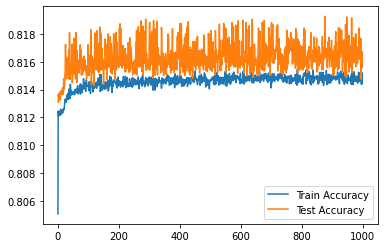



The train and test loss is given below.



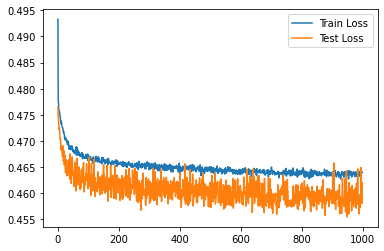

In [125]:
##### Plot the train and test loss and accuracy #####
print('The keys of this history of model is {}'.format(history_.history.keys()))
print('\n')

print('The train and test accuracy is given below.\n')
plt.plot(history_.history['accuracy'], label = 'train accuracy'.title())
plt.plot(history_.history['val_accuracy'], label = 'test accuracy'.title())
plt.legend()
plt.show()

print('\n')

print('The train and test loss is given below.\n')
plt.plot(history_.history['loss'], label = 'train loss'.title())
plt.plot(history_.history['val_loss'], label = 'test loss'.title())
plt.legend()
plt.show()

Handle the Imbalanced dataset using Imblearn Functions and check the performance

In [170]:
##### Import the dataset #####
df_check = pd.read_csv('/content/transact_train.txt', delimiter = '|', na_values = ['?', '??'])

##### Drop all NaN value from the dataset #####
df_check.dropna(inplace = True, axis = 0)

##### Convert the target class #####
df_check.loc[:, 'order'] = df_check.loc[:, 'order'].map({'y': 1, 'n': 0})

df_check.head()

df_check.drop(['customerNo'], axis = 1, inplace = True)
df_check.drop(['availability'], axis = 1, inplace = True)
df_check.drop(['sessionNo'], axis = 1, inplace = True)

In [171]:
##### Check the NaN #####
if df_check.isnull().sum().sum() == 0:
  print('No NaN value in this dataset')
else:
  print('NaN value in this dataset.')

No NaN value in this dataset


In [172]:
##### Show the shape of this dataset #####
print('The shape of this dataset is {}'.format(df_check.shape))

The shape of this dataset is (141163, 21)


In [173]:
##### Take the target class ####
y_imbalanced = df_check.loc[:, 'order']

##### Drop it from the dataframe #####
df_check.drop(['order'], axis = 1, inplace = True)

X_imbalanced = df_check.loc[:]

print('X shape of this dataset is {}'.format(X_imbalanced.shape),'\n')
print('y shape of this dataset is {}'.format(y_imbalanced.shape),'\n')

X shape of this dataset is (141163, 20) 

y shape of this dataset is (141163,) 



In [174]:
##### Using get_dummies to handle the categorical data #####
X_balanced_ = pd.get_dummies(data = X_imbalanced, drop_first = True)
X_balanced_.head()

,startHour,startWeekday,duration,cCount,cMinPrice,cMaxPrice,cSumPrice,bCount,bMinPrice,bMaxPrice,bSumPrice,bStep,maxVal,customerScore,accountLifetime,payments,age,address,lastOrder,onlineStatus_y
1,6,5,11.940,1,59.99,59.99,59.99,1,59.99,59.99,59.99,2.0,600.0,70.0,21.0,1.0,43.0,1.0,49.0,1
11,6,5,324.278,11,9.99,29.99,109.95,2,9.99,29.99,39.98,4.0,1800.0,475.0,302.0,12.0,45.0,1.0,11.0,1
20,6,5,2738.467,45,12.99,179.95,1093.72,4,19.99,27.85,103.54,4.0,800.0,503.0,18.0,1.0,46.0,1.0,40.0,1
21,6,5,2797.247,45,12.99,179.95,1093.72,4,19.99,27.85,103.54,4.0,800.0,503.0,18.0,1.0,46.0,1.0,40.0,1
27,6,5,268.713,6,3.00,20.00,73.00,1,3.00,3.00,3.00,1.0,900.0,575.0,35.0,10.0,31.0,2.0,10.0,1


In [175]:
##### Find the nearest neighbours of KNN #####
import math
math.sqrt(X_imbalanced.shape[0])

375.71664855313503

In [176]:
##### Use Adasyn - Adaptive Synthetic Approach #####
ADASYN_ = ADASYN(random_state = 42)
X_balance_, y_balance_ = ADASYN_.fit_resample(X_balanced_, y_imbalanced)

print('Balanced is done.\n')

Balanced is done.



X balanced data drame shape is (233833, 20)
y balanced data drame shape is (233833,)
The countplot of this traget column is given below.



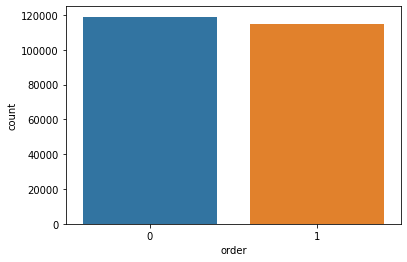

In [177]:
print('X balanced data drame shape is {}'.format(X_balance_.shape,'\n'))
print('y balanced data drame shape is {}'.format(y_balance_.shape,'\n'))

print('The countplot of this traget column is given below.\n')
sns.countplot(y_balance_)
plt.show()

In [178]:
##### preprocessing the dataset #####
standard_scaler_ = StandardScaler()
X_balance_ = standard_scaler_.fit_transform(X_balance_)

print('Scaling is done in this balanced dataset.')

Scaling is done in this balanced dataset.


In [179]:
##### Split the dataset into train and test #####

X_train, X_test, y_train, y_test = train_test_split(X_balance_, y_balance_, test_size = 0.30, shuffle = True, random_state = 42)

print('X_train shape is {}'.format(X_train.shape))
print('X_test  shape is {}'.format(X_test.shape))
print('y_train shape is {}'.format(y_train.shape))
print('y_test  shape is {}'.format(y_test.shape))

X_train shape is (163683, 20)
X_test  shape is (70150, 20)
y_train shape is (163683,)
y_test  shape is (70150,)


In [180]:
##### Models in a list #####
ml_models_ = {'NB': GaussianNB(), 'BNB': BernoulliNB(), 'SGD': SGDClassifier(), 'MLP': MLPClassifier(), 'LR': LogisticRegression(),
              'Perceptron': Perceptron(), 'DT': DecisionTreeClassifier(), 
              'RF': RandomForestClassifier(),'Adaboost': AdaBoostClassifier(), 'GB': GradientBoostingClassifier(), 'XGB': XGBClassifier()}

##### Run the model and check the perfprmance #####

performance_list_    = []

for key_, value_ in ml_models_.items():

  dataframe_dictonary_ = {}

  classifier_ = value_.fit(X_train, y_train)
  predicted_  = classifier_.predict(X_test)

  print('{} classifier is running:\n'.format(key_).upper())

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  dataframe_dictonary_['accuracy score'.upper()] = accuracy_score(predicted_, y_test)

  print("Precision score = ".title(), precision_score(predicted_, y_test))
  dataframe_dictonary_['Precision score'.upper()] = precision_score(predicted_, y_test)

  print("recall score    = ".title(), recall_score(predicted_, y_test))
  dataframe_dictonary_['recall score'.upper()] = recall_score(predicted_, y_test)

  print("f1_score        = ".title(), f1_score(predicted_, y_test))
  dataframe_dictonary_['f1_score '.upper()] = f1_score(predicted_, y_test)

  print('*'*40,'\n')

  ##### Append this into performance list #####
  performance_list_.append(pd.DataFrame(dataframe_dictonary_, index = [key_.upper()]))

NB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6320883820384889
Precision Score =  0.732497662459093
Recall Score    =  0.6008436593725284
F1_Score        =  0.6601709086599866
**************************************** 

BNB CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6313898788310762
Precision Score =  0.5909887798036466
Recall Score    =  0.6303683849654055
F1_Score        =  0.6100437339767758
**************************************** 

SGD CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6694654312188169
Precision Score =  0.5877162225338943
Recall Score    =  0.6890479942448015
F1_Score        =  0.6343609556098714
**************************************** 

MLP CLASSIFIER IS RUNNING:

Accuracy Score  =  0.7786029935851746
Precision Score =  0.8042309490416082
Recall Score    =  0.757089808829597
F1_Score        =  0.7799487099562192
**************************************** 

LR CLASSIFIER IS RUNNING:

Accuracy Score  =  0.6708624376336422
Precision Score =  0.6064457690509584
Recall S

In [192]:
##### Print out the performance ####
pd.concat(performance_list_)

,ACCURACY SCORE,PRECISION SCORE,RECALL SCORE,F1_SCORE
NB,0.632088,0.732498,0.600844,0.660171
BNB,0.631390,0.590989,0.630368,0.610044
SGD,0.669465,0.587716,0.689048,0.634361
MLP,0.778603,0.804231,0.757090,0.779949
LR,0.670862,0.606446,0.683292,0.642580
PERCEPTRON,0.580071,0.511600,0.578772,0.543117
DT,0.923607,0.913686,0.928582,0.921074
RF,0.981896,0.988225,0.975006,0.981571
ADABOOST,0.767840,0.825386,0.732611,0.776236
GB,0.793471,0.856767,0.753624,0.801892


Use Neural Network to check the performance

In [187]:
from sklearn.ensemble._hist_gradient_boosting.loss import BinaryCrossEntropy
##### Create a sequential model #####
model = Sequential()

##### Create first hidden layer with 256 neurons and L2 regularization #####
model.add(Dense(units = 128, activation = 'relu', kernel_initializer = 'he_normal', input_dim = X_train.shape[1]))

##### Create second hidden layer with 128 neurons and L2 regularization #####
model.add(Dense(units = 64, activation = 'relu', kernel_initializer = 'he_normal'))

##### Create third hidden layer with 128 neurons and L2 regularization #####
model.add(Dense(units = 32, activation = 'relu', kernel_initializer = 'he_normal'))
model.add(Dropout(0.3))

##### Create final hidden layer with 1 neurons and sigmoid #####
model.add(Dense(units = 1, activation = 'sigmoid'))

##### compile the model with Adam optimizer #####
model.compile(optimizer = Adam(learning_rate = 0.001), loss = 'binary_crossentropy', metrics = ['accuracy'])

##### show the model history #####
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 128)               2688      
                                                                 
 dense_17 (Dense)            (None, 64)                8256      
                                                                 
 dense_18 (Dense)            (None, 32)                2080      
                                                                 
 dropout_12 (Dropout)        (None, 32)                0         
                                                                 
 dense_19 (Dense)            (None, 1)                 33        
                                                                 
Total params: 13,057
Trainable params: 13,057
Non-trainable params: 0
_________________________________________________________________


In [188]:
history_ = model.fit(x = X_train, y = y_train, batch_size = 512, epochs = 1000, validation_data = (X_test, y_test), verbose = 1)

Epoch 1/1000
320/320 [==============================] - 2s 4ms/step - loss: 0.6097 - accuracy: 0.6676 - val_loss: 0.5719 - val_accuracy: 0.6995
Epoch 2/1000
320/320 [==============================] - 1s 3ms/step - loss: 0.5689 - accuracy: 0.7017 - val_loss: 0.5512 - val_accuracy: 0.7107
Epoch 3/1000
320/320 [==============================] - 1s 3ms/step - loss: 0.5469 - accuracy: 0.7160 - val_loss: 0.5298 - val_accuracy: 0.7261
Epoch 4/1000
320/320 [==============================] - 1s 4ms/step - loss: 0.5262 - accuracy: 0.7291 - val_loss: 0.5105 - val_accuracy: 0.7390
Epoch 5/1000
320/320 [==============================] - 1s 3ms/step - loss: 0.5069 - accuracy: 0.7415 - val_loss: 0.4945 - val_accuracy: 0.7492
Epoch 6/1000
320/320 [==============================] - 1s 4ms/step - loss: 0.4903 - accuracy: 0.7519 - val_loss: 0.4769 - val_accuracy: 0.7620
Epoch 7/1000
320/320 [==============================] - 1s 4ms/step - loss: 0.4757 - accuracy: 0.7610 - val_loss: 0.4684 - val_accuracy:

In [190]:
##### Evaluate the performance #####
predicted_ = np.where(model.predict(X_test) > 0.5, 1, 0)

print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
print("Precision score = ".title(), precision_score(predicted_, y_test))
print("recall score    = ".title(), recall_score(predicted_, y_test))
print("f1_score        = ".title(), f1_score(predicted_, y_test))

2193/2193 [==============================] - 3s 1ms/step
Accuracy Score  =  0.930263720598717
Precision Score =  0.9393700327255727
Recall Score    =  0.9194360235657496
F1_Score        =  0.929296141060847


The keys of this history of model is dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


The train and test accuracy is given below.



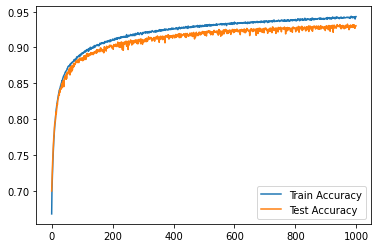



The train and test loss is given below.



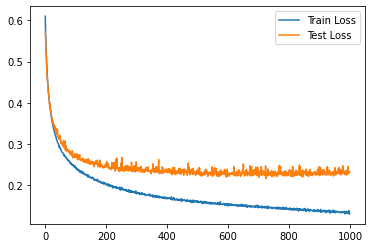

In [189]:
##### Plot the train and test loss and accuracy #####
print('The keys of this history of model is {}'.format(history_.history.keys()))
print('\n')

print('The train and test accuracy is given below.\n')
plt.plot(history_.history['accuracy'], label = 'train accuracy'.title())
plt.plot(history_.history['val_accuracy'], label = 'test accuracy'.title())
plt.legend()
plt.show()

print('\n')

print('The train and test loss is given below.\n')
plt.plot(history_.history['loss'], label = 'train loss'.title())
plt.plot(history_.history['val_loss'], label = 'test loss'.title())
plt.legend()
plt.show()

Use KFold - 10 Cross Validation to evaluate the model and preventing the OVERFITTING.

In [194]:
##### Use KFold Cross Validation to evalaute the model and prevent the overfitting #####

KFold_ = KFold(n_splits = 5, shuffle = True, random_state = 42)
accuracy_score_, precision_score_, recall_score_, f1_score_, history_list_, count_ = [], [], [], [], [], 1

for train_index_, test_index_ in KFold_.split(X_balance_, y_balance_):

  print(f'# of Cross validation {count_} is running.\n')

  X_train, X_test = X_balance_[train_index_], X_balance_[test_index_]
  y_train, y_test = y_balance_[train_index_], y_balance_[test_index_]

  history_ = model.fit(x = X_train, y = y_train, batch_size = 512, epochs = 200, validation_data = (X_test, y_test), verbose = 1)

  history_list_.append(history_)

  ##### Evaluate the performance #####
  predicted_ = np.where(model.predict(X_test) > 0.5, 1, 0)

  print("accuracy score  = ".title(), accuracy_score(predicted_, y_test))
  print("Precision score = ".title(), precision_score(predicted_, y_test))
  print("recall score    = ".title(), recall_score(predicted_, y_test))
  print("f1_score        = ".title(), f1_score(predicted_, y_test),'\n\n')


  print('*'*120)

  accuracy_score_.append(accuracy_score(predicted_, y_test))
  precision_score_.append(precision_score(predicted_, y_test))
  recall_score_.append(recall_score(predicted_, y_test))
  f1_score_.append(f1_score(predicted_, y_test))

  count_ = count_ + 1

# of Cross validation 1 is running.

Epoch 1/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1515 - accuracy: 0.9385 - val_loss: 0.2278 - val_accuracy: 0.9296
Epoch 2/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1504 - accuracy: 0.9375 - val_loss: 0.2173 - val_accuracy: 0.9305
Epoch 3/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1475 - accuracy: 0.9382 - val_loss: 0.2158 - val_accuracy: 0.9297
Epoch 4/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1469 - accuracy: 0.9386 - val_loss: 0.2174 - val_accuracy: 0.9297
Epoch 5/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1488 - accuracy: 0.9378 - val_loss: 0.2105 - val_accuracy: 0.9311
Epoch 6/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1468 - accuracy: 0.9386 - val_loss: 0.2350 - val_accuracy: 0.9264
Epoch 7/200
366/366 [==============================] - 1s 3ms/step - loss: 0.1468 - accuracy: 0.9386 - va

In [202]:
##### Show the performance #####
print('The list of accuracy list is {}'.format(accuracy_score_),'\n')
print('The list of precision list is {}'.format(precision_score_),'\n')
print('The list of recall is {}'.format(recall_score_),'\n')
print('The list of f1 score is {}'.format(f1_score_),'\n')
print('*'*120,'\n')
print('The accuracy is  = {}'.format(np.array(accuracy_score_).mean(),'\n'))
print('The precision is = {}'.format(np.array(precision_score_).mean(),'\n'))
print('The recall is    = {}'.format(np.array(recall_score_).mean(),'\n'))
print('The f1 score is  = {}'.format(np.array(f1_score_).mean()))

The list of accuracy list is [0.9335856479996579, 0.94549575555413, 0.9498150405200249, 0.9533635547192405, 0.9549886669802848] 

The list of precision list is [0.931156879929886, 0.961545192055298, 0.9593076620481664, 0.9618528610354223, 0.9747651820109943] 

The list of recall is [0.9326281601123596, 0.9293839062962493, 0.9393939393939394, 0.9448126433851645, 0.9366941186257383] 

The list of f1 score is [0.93189193930357, 0.9451910465091278, 0.9492463724239344, 0.9532566064424869, 0.9553505143705588] 

************************************************************************************************************************ 

The accuracy is  = 0.9474497331546676
The precision is = 0.9577255554159534
The recall is    = 0.9365825535626902
The f1 score is  = 0.9469872958099357


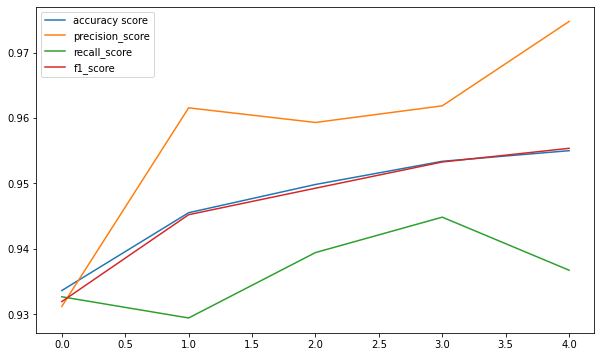

In [211]:
##### plot this #####
plt.figure(figsize = (10, 6))
plt.plot(accuracy_score_, label = 'accuracy score')
plt.plot(precision_score_, label = 'precision_score')
plt.plot(recall_score_, label = 'recall_score')
plt.plot(f1_score_, label = 'f1_score')

plt.legend()
plt.show()

Cross validation 0.



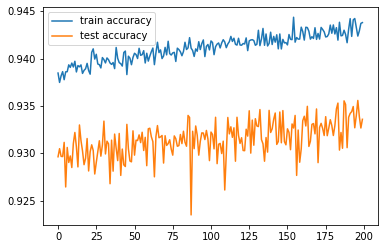

Cross validation 1.



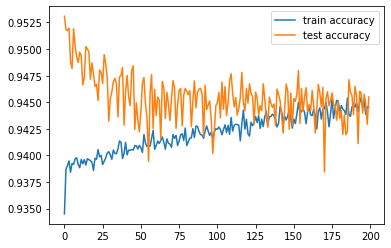

Cross validation 2.



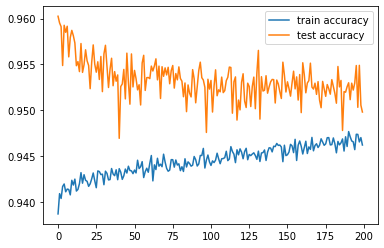

Cross validation 3.



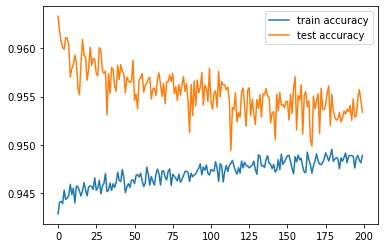

Cross validation 4.



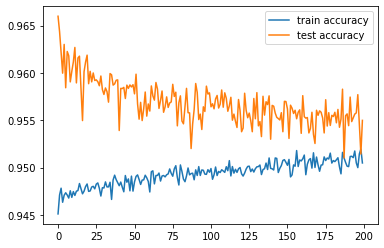

In [205]:
##### plot the history in each cross validation #####
for index_, each_history_ in enumerate(history_list_):
  
  print(f'Cross validation {index_}.\n')

  plt.plot(each_history_.history['accuracy'], label = 'train accuracy')
  plt.plot(each_history_.history['val_accuracy'], label = 'test accuracy')
  plt.legend()
  
  plt.show()

Cross validation 0.



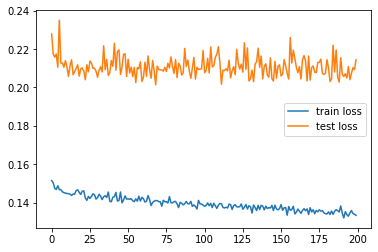

Cross validation 1.



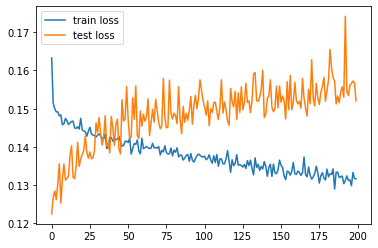

Cross validation 2.



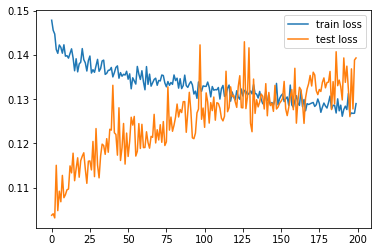

Cross validation 3.



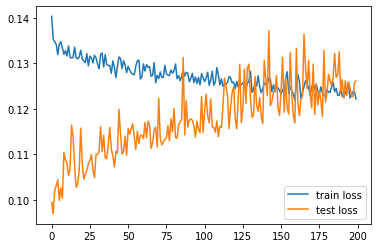

Cross validation 4.



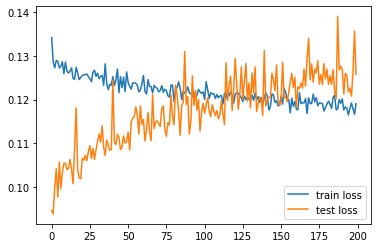

In [206]:
##### plot the history in each cross validation #####
for index_, each_history_ in enumerate(history_list_):
  
  print(f'Cross validation {index_}.\n')

  plt.plot(each_history_.history['loss'], label = 'train loss')
  plt.plot(each_history_.history['val_loss'], label = 'test loss')
  plt.legend()
  
  plt.show()

In [212]:
##### Comments after analyse #####
print('After analyse, Using ADASYN the accuracy with other metrics for evaluating the model is increased and performs well than previous.')

After analyse, Using ADASYN the accuracy with other metrics for evaluating the model is increased and performs well than previous.


In [214]:
##### Save the model so that i can use it later #####
model.save('online_orders.h5')

print('Saved succesfully.')

Saved succesfully.
